<a href="https://colab.research.google.com/github/an-42-an/uidai1/blob/ananya/uidai1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Data Cleaning

Text & State Standardization

In [1]:
import pandas as pd

In [2]:
def sp_low(df,cols):
  df[cols]=df[cols].apply(lambda s:s.astype(str).str.replace(' ','',regex=False).str.lower())
  return df

In [3]:
def state_proc(df):
  keys = {
    "andaman": "andamanandnicobarislands",
    "andhra": "andhrapradesh",
    "arunachal": "arunachalpradesh",
    "assam": "assam",
    "bihar": "bihar",
    "chandigarh": "chandigarh",
    "chhat": "chhattisgarh",
    "delhi": "delhi",
    "goa": "goa",
    "gujarat": "gujarat",
    "haryana": "haryana",
    "himachal": "himachalpradesh",
    "jharkhand": "jharkhand",
    "karnataka": "karnataka",
    "kerala": "kerala",
    "ladakh": "ladakh",
    "lakshadweep": "lakshadweep",
    "madhya": "madhyapradesh",
    "maharashtra": "maharashtra",
    "manipur": "manipur",
    "meghalaya": "meghalaya",
    "mizoram": "mizoram",
    "nagaland": "nagaland",
    "odisha": "odisha",
    "orissa": "odisha",
    "pudu": "puducherry",
    "pond": "puducherry",
    "punjab": "punjab",
    "rajasthan": "rajasthan",
    "sikkim": "sikkim",
    "tamilnadu": "tamilnadu",
    "telangana": "telangana",
    "tripura": "tripura",
    "uttarpradesh": "uttarpradesh",
    "khand": "uttarakhand",
    "chal": "uttarakhand",
    "westb": "westbengal",
    "jammu": "jammuandkashmir",
    "dadra": "dadranagarhavelidamandiu",
    "daman": "dadranagarhavelidamandiu",
    "balanagar": "telangana",
    "jaipur": "rajasthan",
    "madanapalle": "andhrapradesh",
    "darbhanga": "bihar",
    "puttenahalli": "karnataka",
    "nagpur": "maharashtra",
    "rajaannamalaipuram": "tamilnadu",
    'greaterkailash2':'delhi',
    'punecity':'maharashtra',
    'gurgaon':'haryana',
    'puthur':'tamilnadu'
  }

  def map_state(val):
    for k in keys:
        if k in val:
            return keys[k]
    return val

  df['State'] = df['State'].astype(str).apply(map_state)
  return df

# Preprocessing and inspection - Biometric data

Preprocessing

In [4]:
# import glob
from datasets import load_dataset
import matplotlib.pyplot as plt

In [5]:
ds = load_dataset("an42/uidai1", data_files="bioapi1.csv")
biodf = ds["train"].to_pandas()

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


bioapi1.csv:   0%|          | 0.00/216M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [6]:
biodf['Date']=pd.to_datetime(biodf['Date'],dayfirst=True)
biodf['Year_month']=biodf['Date'].dt.strftime('%Y-%m')
biodf=state_proc(sp_low(biodf,['State','District']))
biodf=biodf[(biodf['State']!='100000')&(biodf['Year_month']!='2026-01')]
bioage=[c for c in biodf.columns if 'age' in c]
biog=biodf.groupby(['State','Year_month'])[bioage].sum().reset_index()

Inspection

In [7]:
biodf.columns

Index(['Date', 'State', 'District', 'Pincode', 'Bio_age_5_17', 'Bio_age_17+',
       'Year_month'],
      dtype='object')

In [8]:
biodf.count()

,0
Date,4926234
State,4926234
District,4926234
Pincode,4926234
Bio_age_5_17,4926234
Bio_age_17+,4926234
Year_month,4926234


In [9]:
bioym=biodf['Year_month'].unique()
bioym

array(['2025-12', '2025-11', '2025-10', '2025-09', '2025-08', '2025-07',
       '2025-06', '2025-05', '2025-03', '2025-04'], dtype=object)

In [10]:
biost=biodf['State'].unique()
biost

array(['andamanandnicobarislands', 'andhrapradesh', 'arunachalpradesh',
       'assam', 'bihar', 'chhattisgarh', 'delhi', 'goa', 'gujarat',
       'himachalpradesh', 'jharkhand', 'karnataka', 'odisha', 'punjab',
       'rajasthan', 'tamilnadu', 'maharashtra', 'kerala', 'ladakh',
       'madhyapradesh', 'telangana', 'tripura', 'uttarpradesh',
       'uttarakhand', 'westbengal', 'manipur', 'meghalaya', 'mizoram',
       'nagaland', 'puducherry', 'sikkim', 'haryana', 'chandigarh',
       'jammuandkashmir', 'dadranagarhavelidamandiu', 'lakshadweep'],
      dtype=object)

# Total Biometric Updates by Month, State-wise

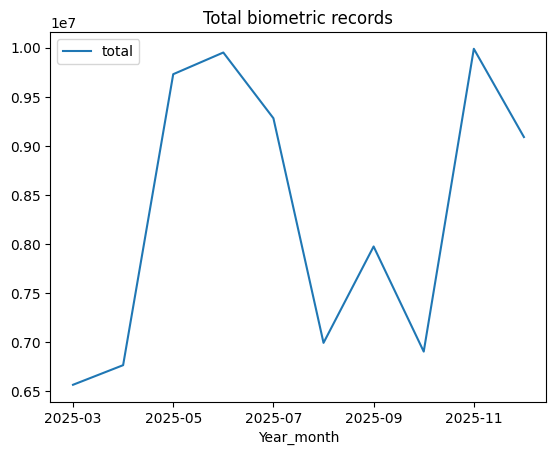

In [11]:
tot=biodf.groupby('Year_month')[bioage].sum().sum(axis=1).reset_index(name='total')

ax=tot.plot(x='Year_month',y='total',title='Total biometric records')
plt.show()


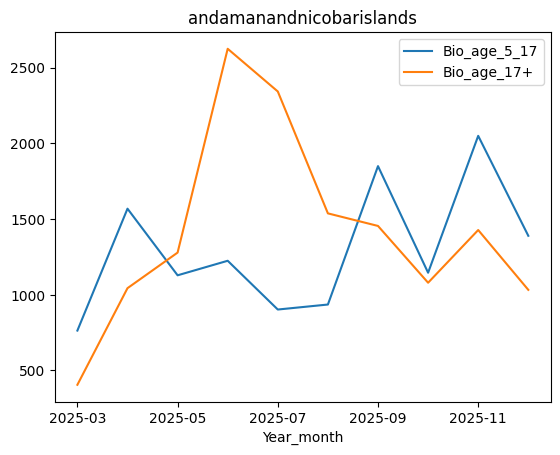

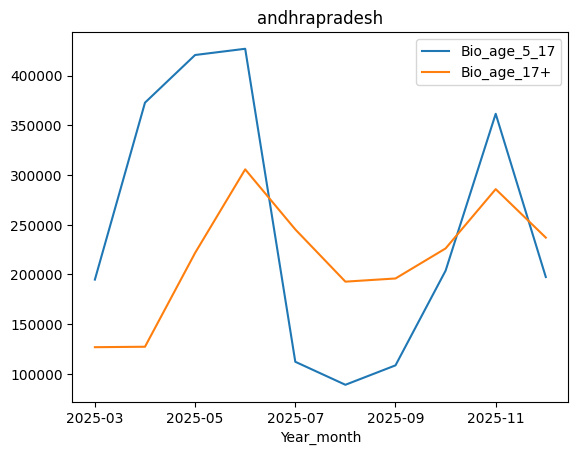

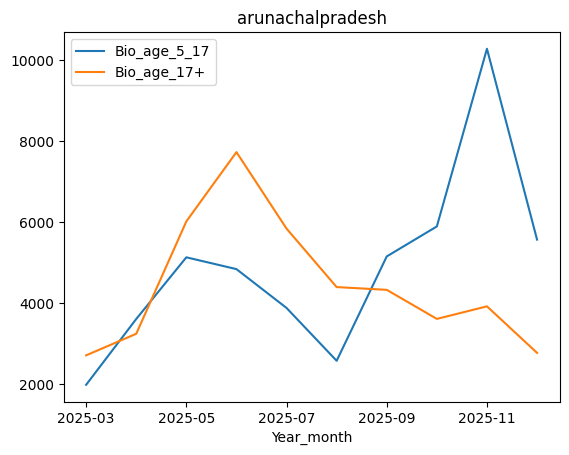

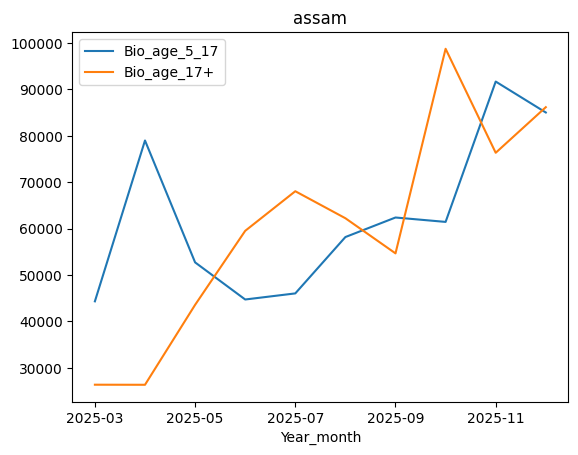

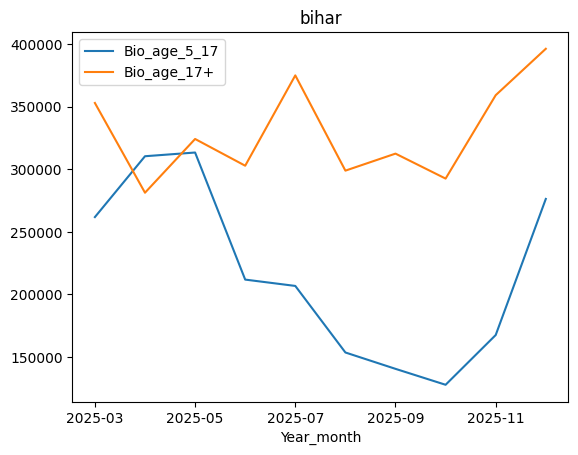

...

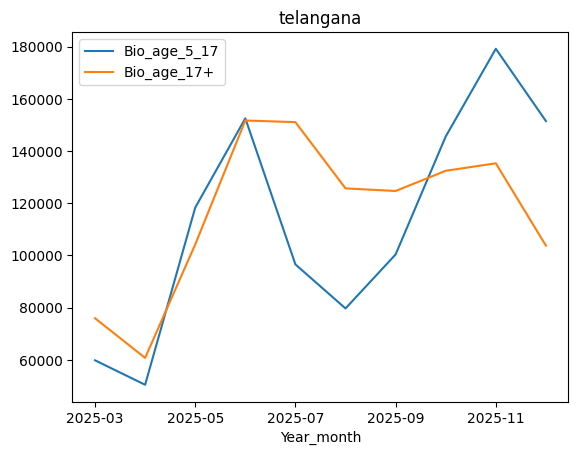

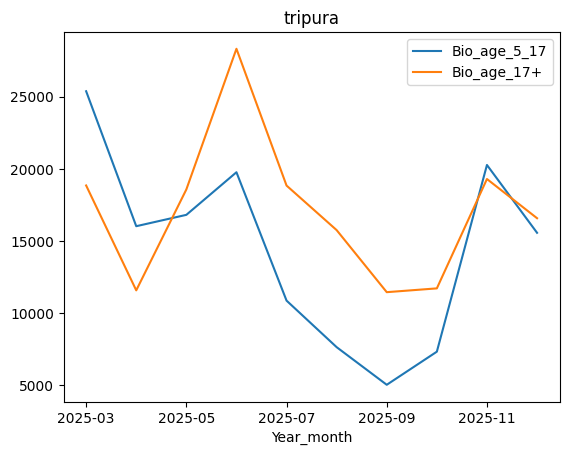

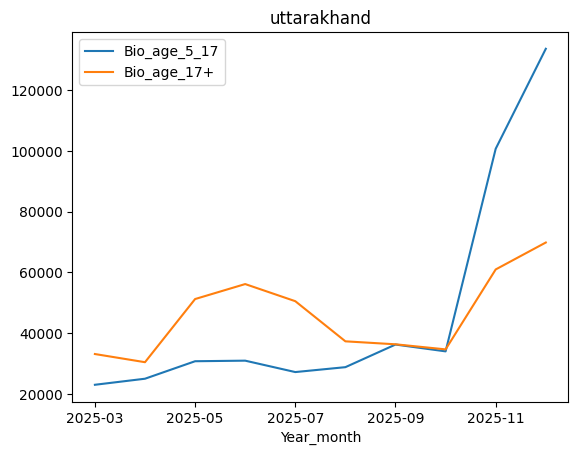

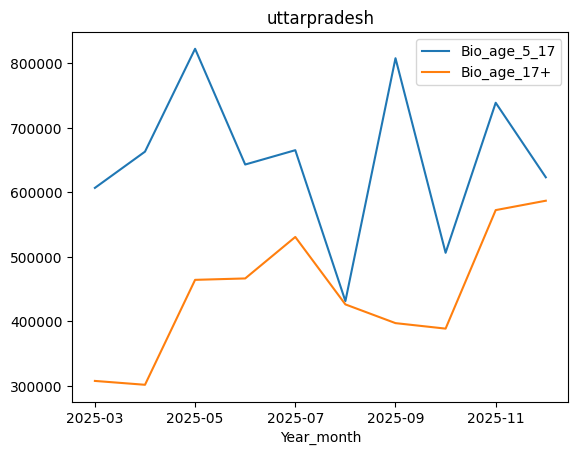

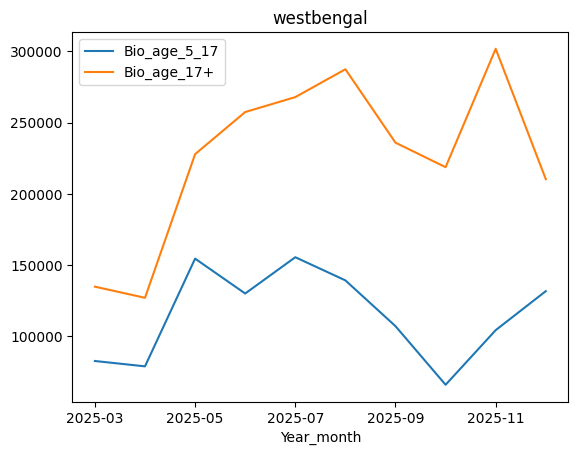

In [12]:
for state,d in biog.groupby('State'):
  d.plot(x='Year_month',y=bioage,title=state)
  plt.show()

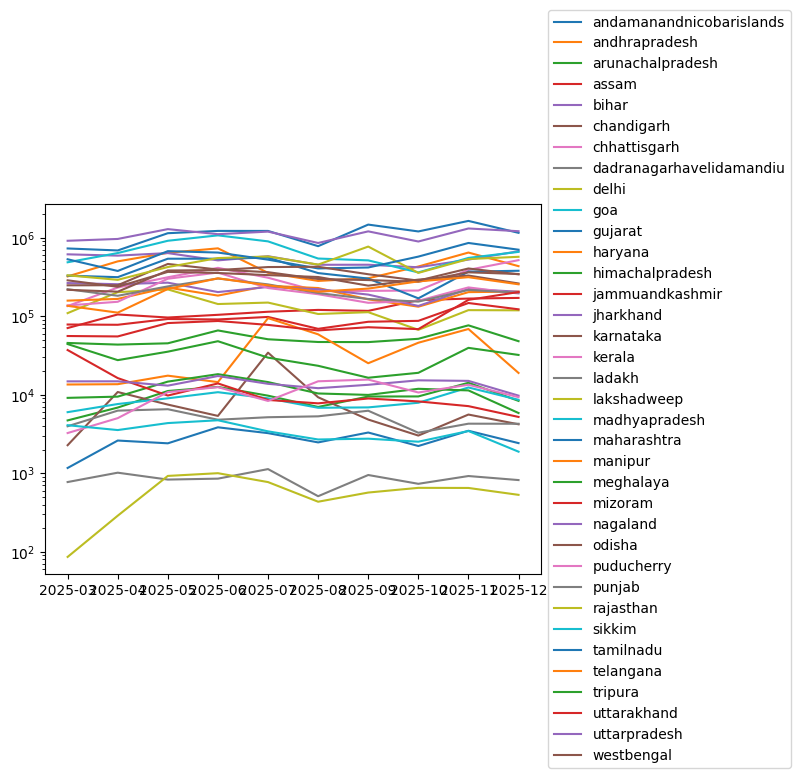

In [13]:
# same as previous but on a log scale

plt.figure()

for state, d in biog.groupby('State'):
  y = d[bioage].sum(axis=1)
  plt.plot(d['Year_month'], y, label=state)

plt.yscale('log')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# plt.tight_layout()
plt.show()


# Preprocessing and inspection - Enrollment data

Preprocessing



In [14]:
ds = load_dataset("an42/uidai1", data_files="enrolapi1.csv")
enroldf = ds["train"].to_pandas()

enrolapi1.csv:   0%|          | 0.00/53.9M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [15]:
enroldf['Date']=pd.to_datetime(enroldf['Date'],dayfirst=True)
enroldf['Year_month']=enroldf['Date'].dt.strftime('%Y-%m')
enroldf=state_proc(sp_low(enroldf,['State','District']))
enroldf=enroldf[(enroldf['State']!='100000')&(enroldf['Year_month']!='2026-01')]
enrolage=[c for c in enroldf.columns if 'Age' in c]
enrolg=enroldf.groupby(['State','Year_month'])[enrolage].sum().reset_index()

Inspection

In [16]:
enrolym=enroldf['Year_month'].unique()
enrolym

array(['2025-09', '2025-04', '2025-05', '2025-06', '2025-07', '2025-03',
       '2025-10', '2025-11', '2025-12'], dtype=object)

In [17]:
enroldf['State'].unique()

array(['andhrapradesh', 'arunachalpradesh', 'assam', 'bihar',
       'chandigarh', 'chhattisgarh', 'dadranagarhavelidamandiu', 'delhi',
       'goa', 'gujarat', 'haryana', 'himachalpradesh', 'jammuandkashmir',
       'jharkhand', 'karnataka', 'kerala', 'ladakh', 'madhyapradesh',
       'maharashtra', 'manipur', 'meghalaya', 'mizoram', 'nagaland',
       'odisha', 'punjab', 'uttarpradesh', 'westbengal', 'rajasthan',
       'tamilnadu', 'telangana', 'tripura', 'uttarakhand',
       'andamanandnicobarislands', 'sikkim', 'lakshadweep', 'puducherry'],
      dtype=object)

In [18]:
enroldf.count()

,0
Date,1167134
State,1167134
District,1167134
Pincode,1167134
Age_0_5,1167134
Age_5_17,1167134
Age_18_greater,1167134
Year_month,1167134


# Total Enrollments by Month, State-wise

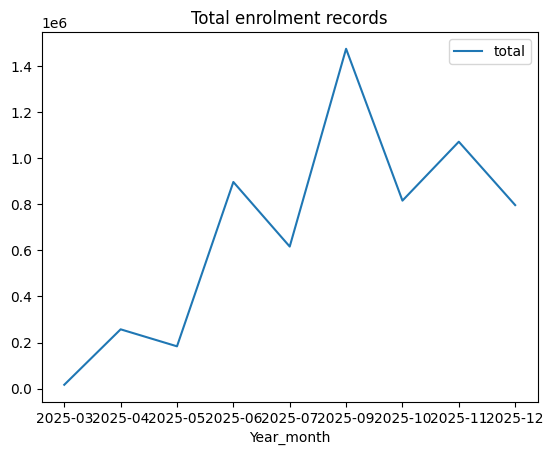

In [19]:
tot=enroldf.groupby('Year_month')[enrolage].sum().sum(axis=1).reset_index(name='total')

ax=tot.plot(x='Year_month',y='total',title='Total enrolment records')
plt.show()

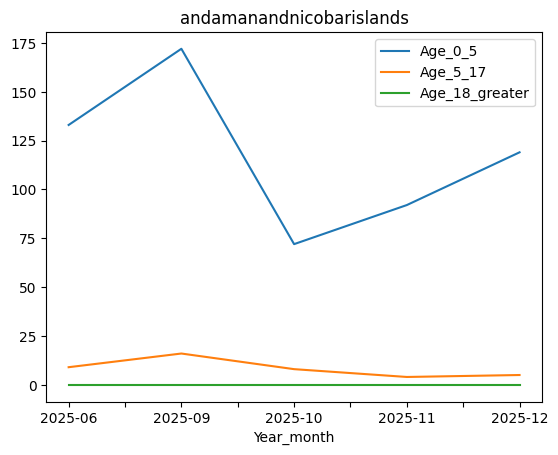

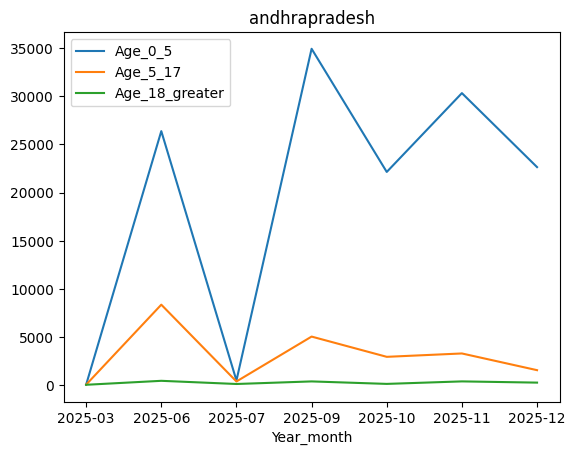

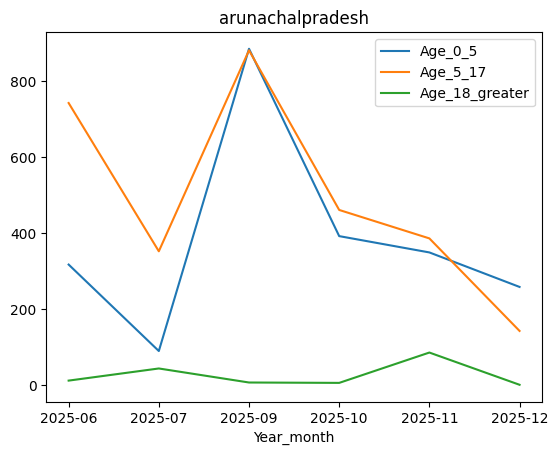

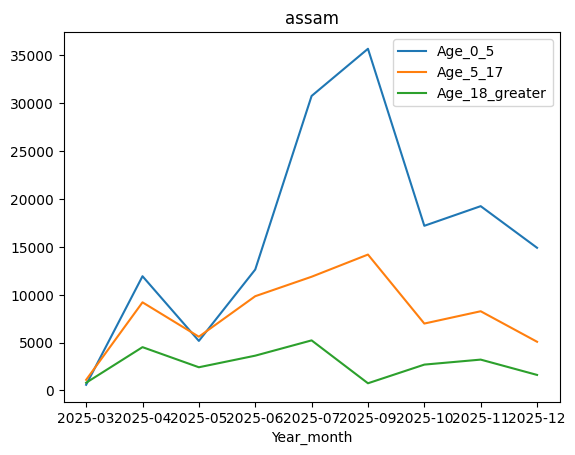

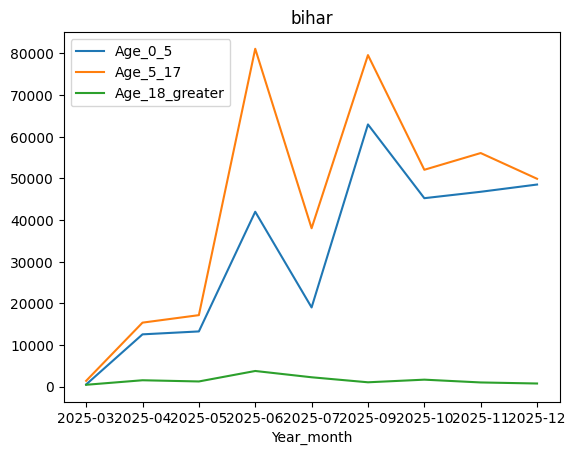

...

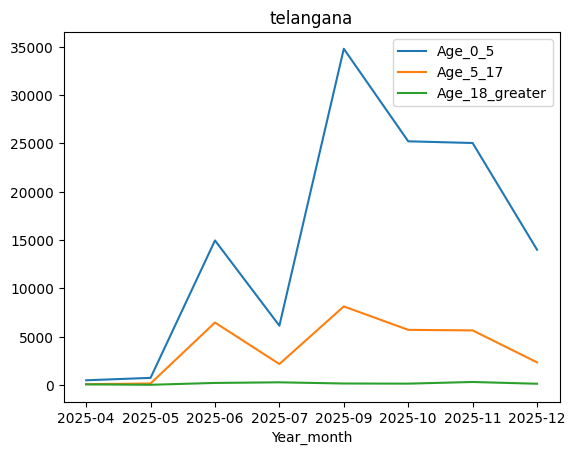

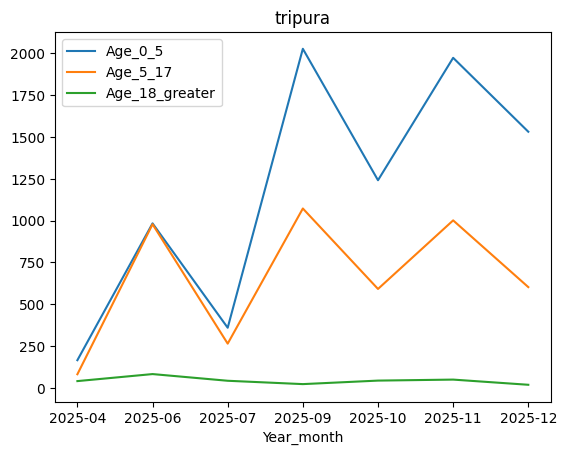

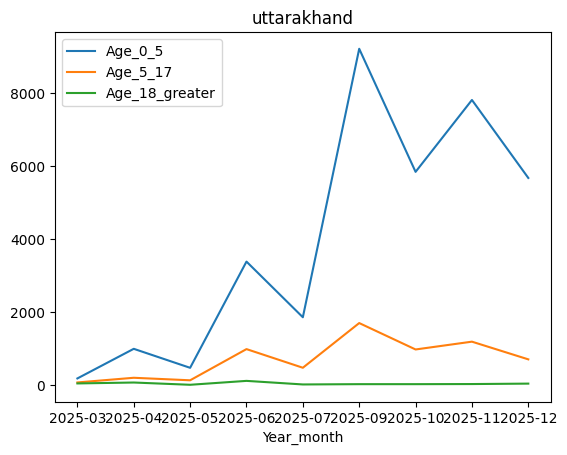

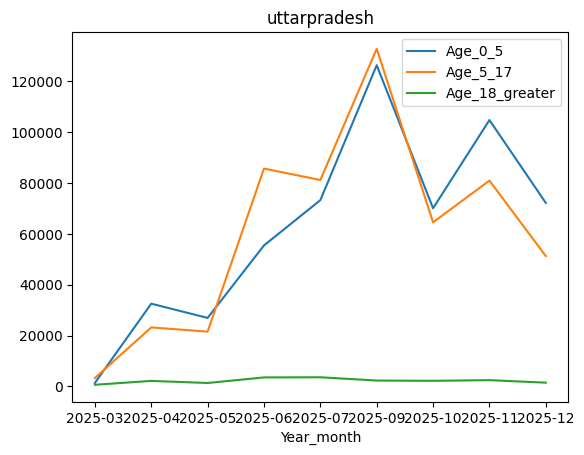

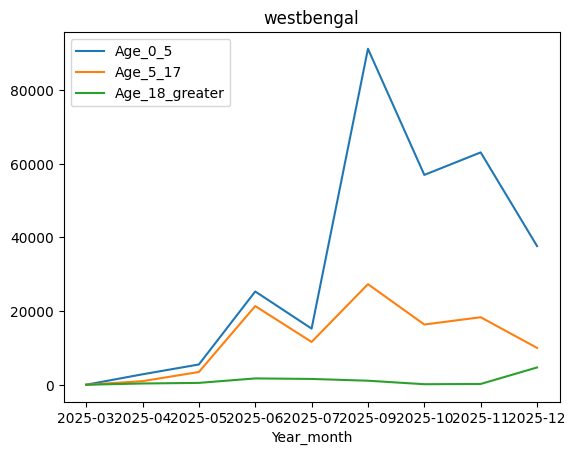

In [20]:
for state,d in enrolg.groupby('State'):
  d.plot(x='Year_month',y=enrolage,title=state)
  plt.show()

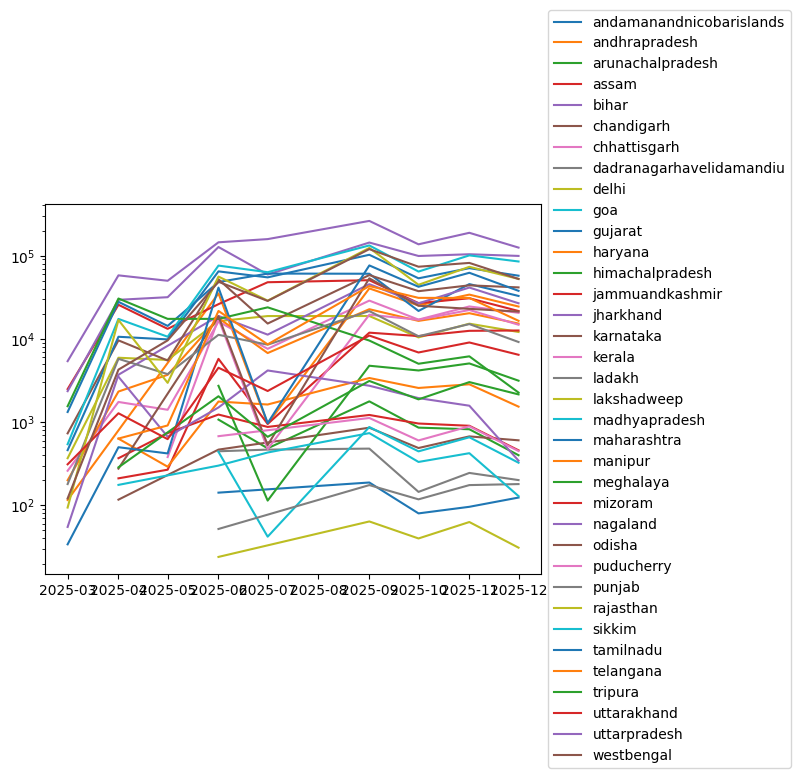

In [21]:
plt.figure()

for state, d in enrolg.groupby('State'):
  x = pd.to_datetime(d['Year_month'], errors='raise')
  y = d[enrolage].sum(axis=1)
  plt.plot(x,y, label=state)

plt.yscale('log')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# plt.tight_layout()
plt.show()


# Preprocessing and inspection - Enrollment data

Preprocessing



In [22]:
ds = load_dataset("an42/uidai1", data_files="demoapi1.csv")
demodf = ds["train"].to_pandas()

demoapi1.csv:   0%|          | 0.00/103M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [23]:
demodf['Date']=pd.to_datetime(demodf['Date'],dayfirst=True)
demodf['Year_month']=demodf['Date'].dt.strftime('%Y-%m')
demodf=state_proc(sp_low(demodf,['State','District']))
demodf=demodf[(demodf['State']!='100000')&(demodf['State']!='561203')&(demodf['Year_month']!='2026-01')]
demoage=[c for c in demodf.columns if 'age' in c]
demog=demodf.groupby(['State','Year_month'])[demoage].sum().reset_index()

Inspection

In [24]:
demodf.count()

,0
Date,2287228
State,2287228
District,2287228
Pincode,2287228
Demo_age_5_17,2287228
Demo_age_17+,2287228
Year_month,2287228


In [25]:
demoym=demodf['Year_month'].unique()
demoym

array(['2025-03', '2025-04', '2025-05', '2025-06', '2025-07', '2025-09',
       '2025-10', '2025-11', '2025-12'], dtype=object)

In [26]:
demodf['State'].unique()

array(['westbengal', 'manipur', 'rajasthan', 'himachalpradesh',
       'telangana', 'kerala', 'uttarpradesh', 'madhyapradesh', 'bihar',
       'karnataka', 'maharashtra', 'punjab', 'gujarat', 'assam',
       'haryana', 'tamilnadu', 'odisha', 'arunachalpradesh',
       'andhrapradesh', 'uttarakhand', 'mizoram', 'chhattisgarh',
       'jharkhand', 'jammuandkashmir', 'delhi', 'goa', 'tripura',
       'chandigarh', 'sikkim', 'nagaland', 'meghalaya', 'puducherry',
       'ladakh', 'dadranagarhavelidamandiu', 'andamanandnicobarislands',
       'lakshadweep'], dtype=object)

In [27]:
demodf['District'].unique()

array(['murshidabad', 'thoubal', 'sirohi', 'hooghly', 'una', 'sangareddy',
       'kannur', 'jaipur', 'varanasi', 'budaun', 'tikamgarh', 'fatehpur',
       'supaul', 'ramanagar', 'thiruvananthapuram', 'mandsaur',
       'pilibhit', 'buldhana', 'fatehgarhsahib', 'ratlam', 'gandhinagar',
       'samastipur', 'indore', 'gwalior', 'kollam', 'siwan', 'goalpara',
       'yamunanagar', 'tiruvannamalai', 'nirmal', 'rajkot', 'kachchh',
       'mayurbhanj', 'papumpare', 'jalandhar', 'n.t.r', 'nalbari',
       'nashik', 'palghar', 'vizianagaram', 'dharwad', 'almora',
       'jaisalmer', 'nagpur', 'kalaburagi', 'kolkata', 'nagaur', 'kolar',
       'tiruvallur', 'puri', 'deoria', 'agarmalwa', 'belgaum', 'navsari',
       'mamit', 'hanumakonda', 'jodhpur', 'balaghat', 'sikar',
       'udhamsinghnagar', 'barabanki', 'nadia', 'nalanda', 'perambalur',
       'harda', 'panchmahals', 'thanjavur', 'tumkur', 'rajannasircilla',
       'ganjam', 'anantapur', 'rangareddi', 'y.s.r', 'chengalpattu',
       'ahm

# Total Demographic Updates by Month, State-wise

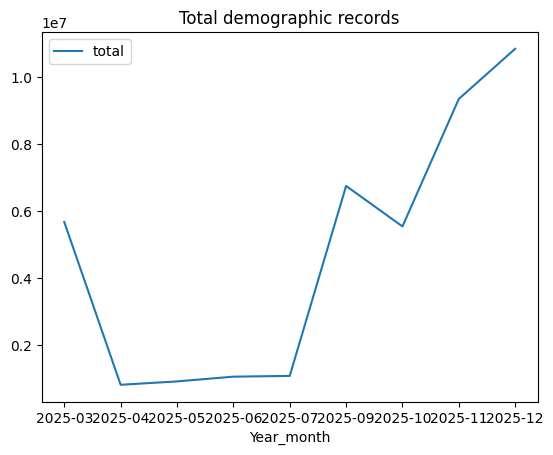

In [28]:
tot=demodf.groupby('Year_month')[demoage].sum().sum(axis=1).reset_index(name='total')

ax=tot.plot(x='Year_month',y='total',title='Total demographic records')
plt.show()

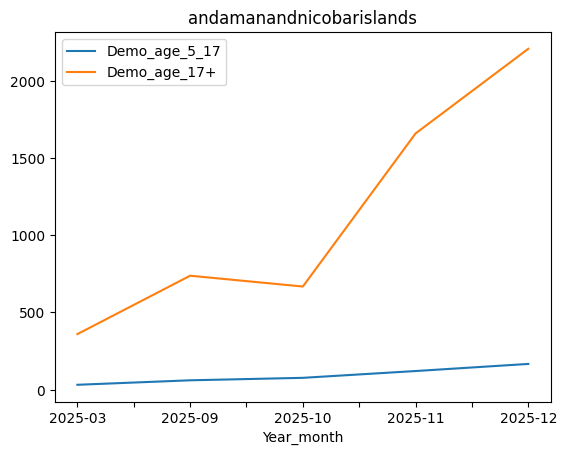

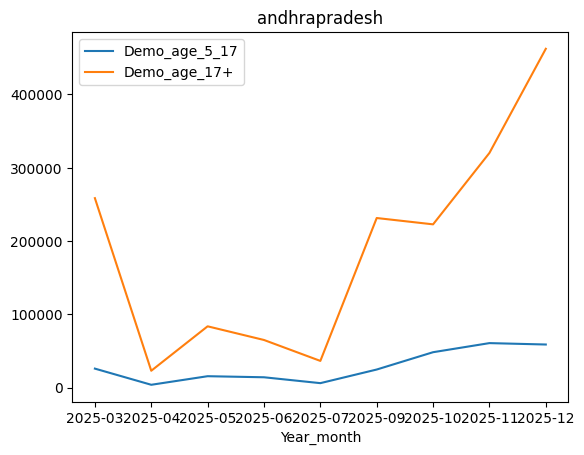

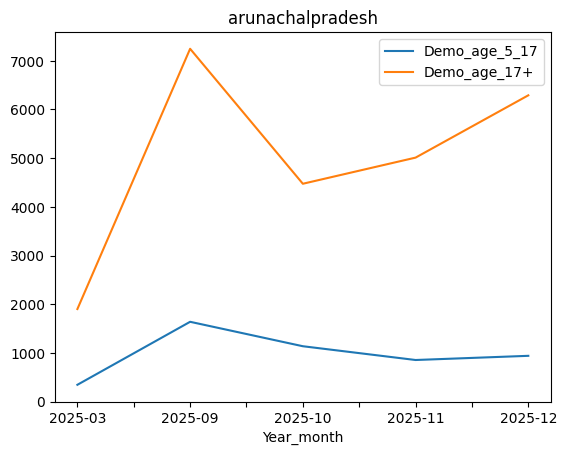

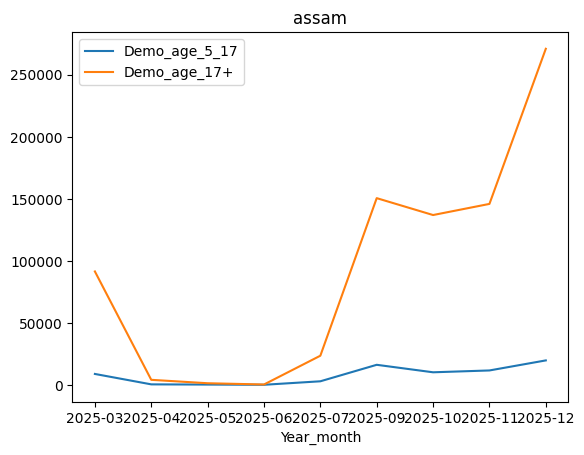

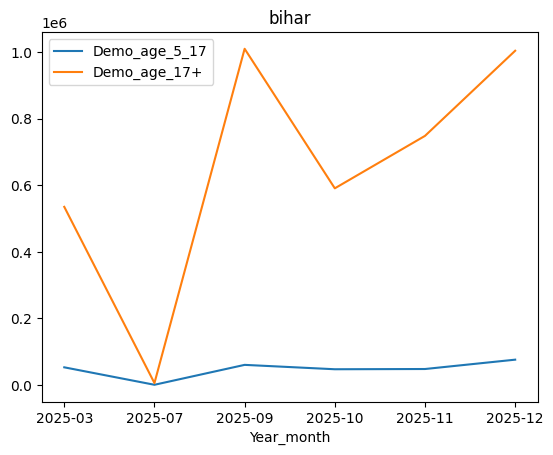

...

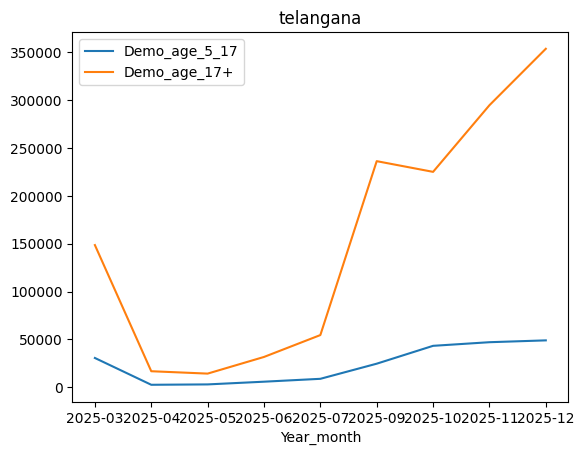

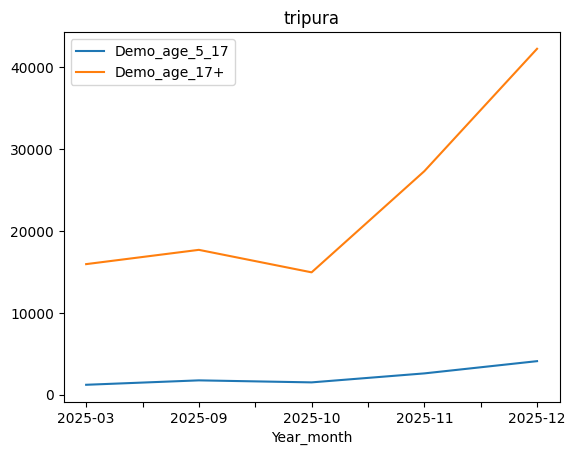

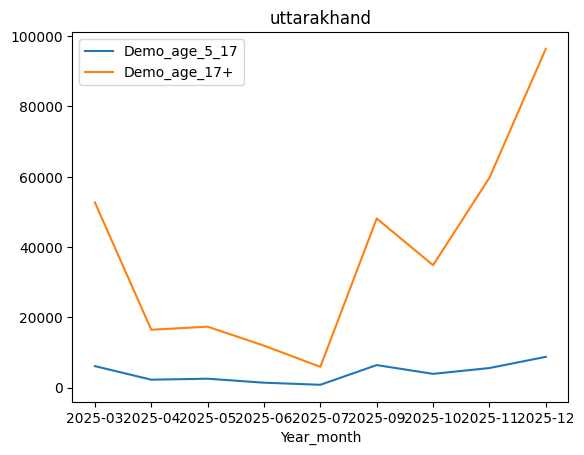

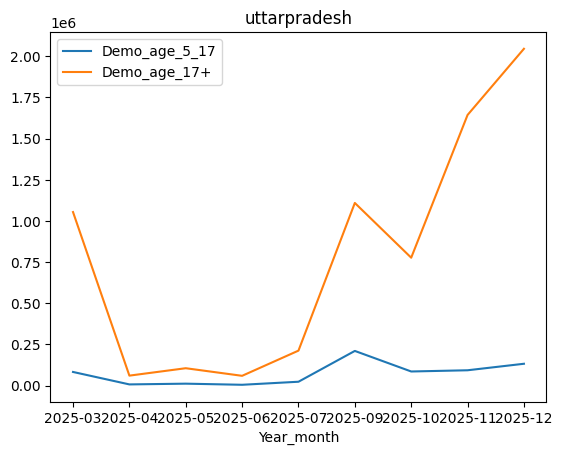

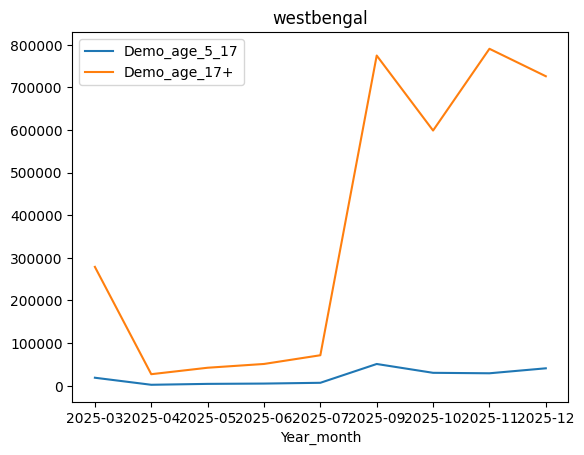

In [29]:
for state,d in demog.groupby('State'):
  d.plot(x='Year_month',y=demoage,title=state)
  plt.show()

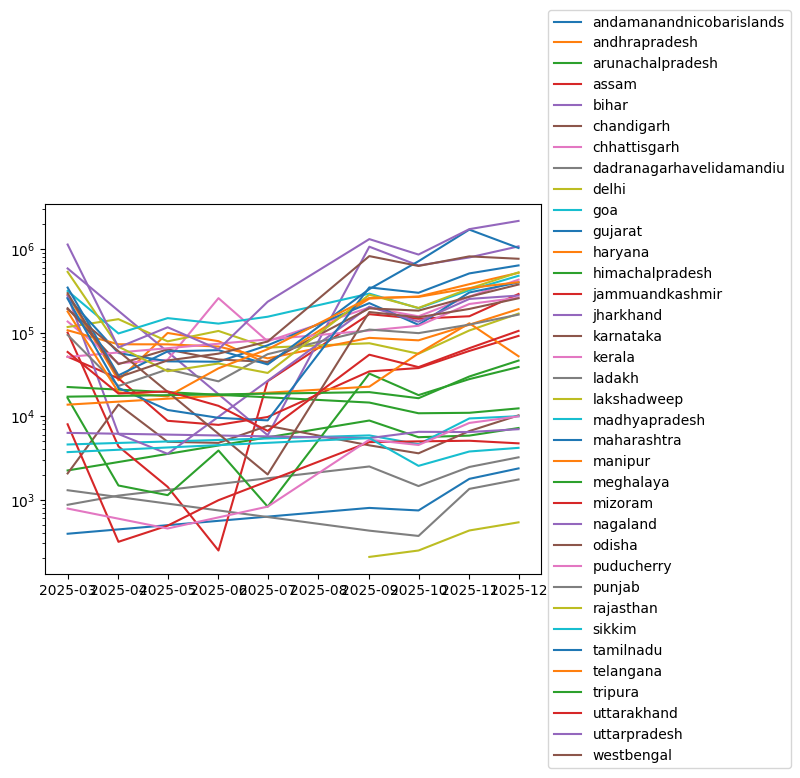

In [30]:
plt.figure()

for state, d in demog.groupby('State'):
  x = pd.to_datetime(d['Year_month'], errors='raise')
  y = d[demoage].sum(axis=1)
  plt.plot(x,y, label=state)

plt.yscale('log')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# plt.tight_layout()
plt.show()

# Z-Score & Ratio Analysis

Normalization & Ratio Analysis - Demographic Data

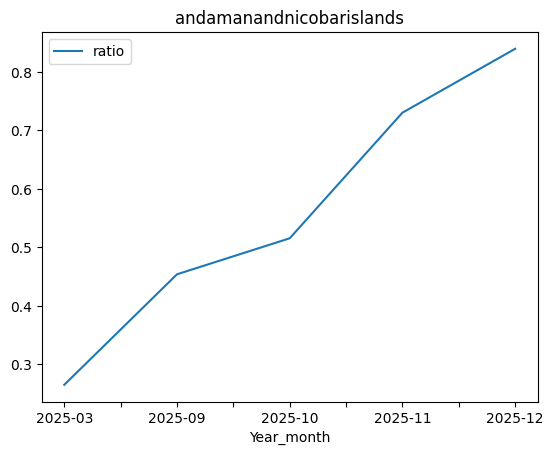

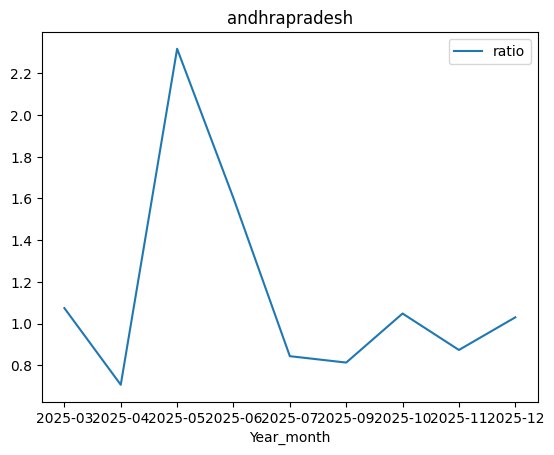

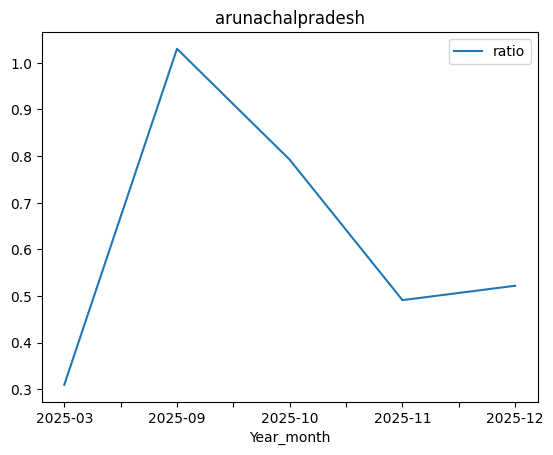

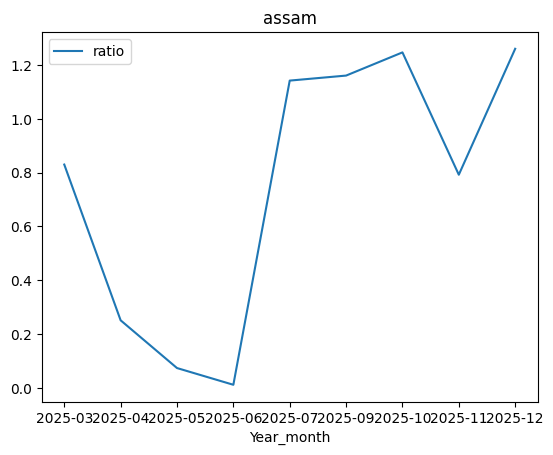

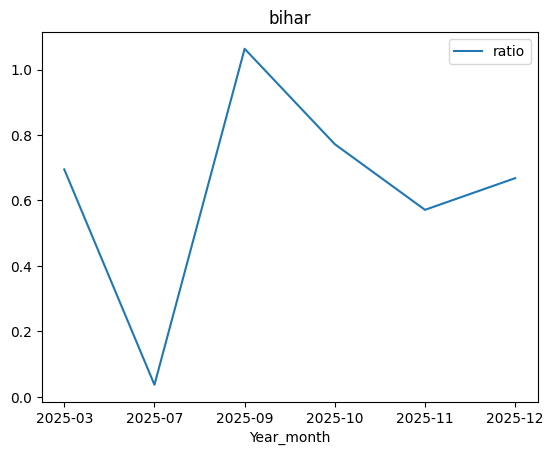

...

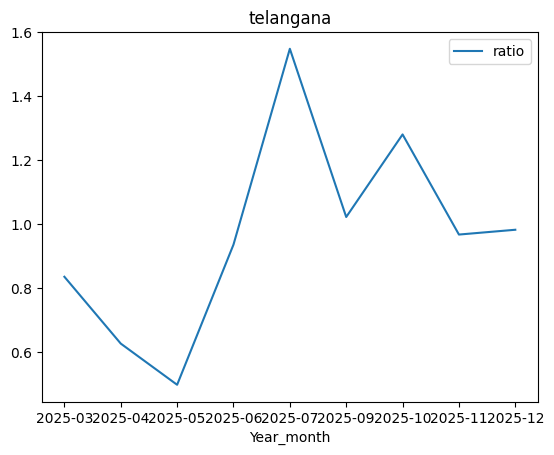

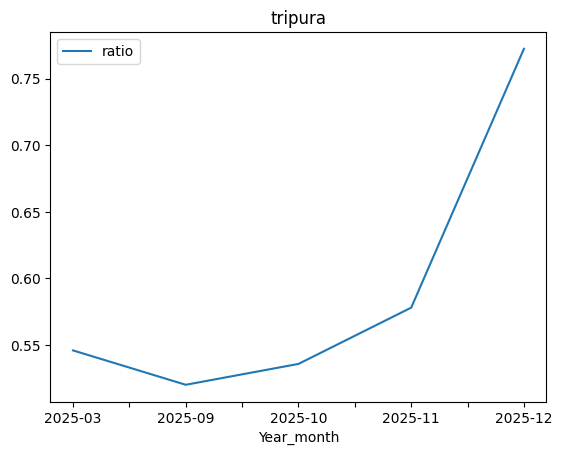

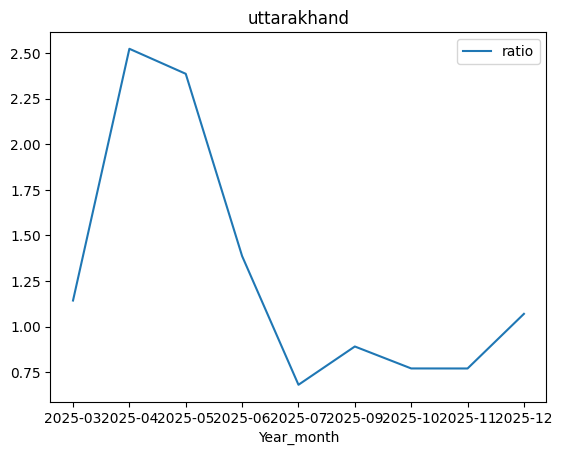

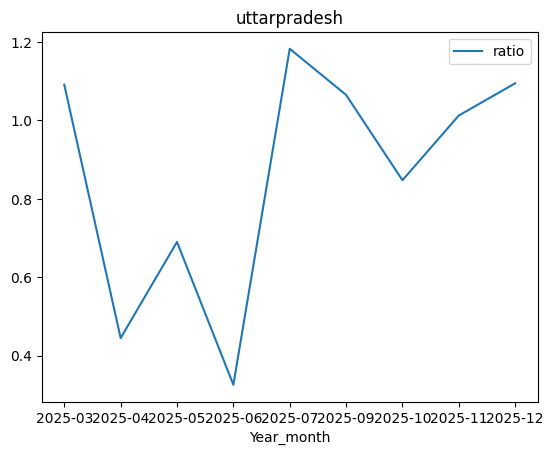

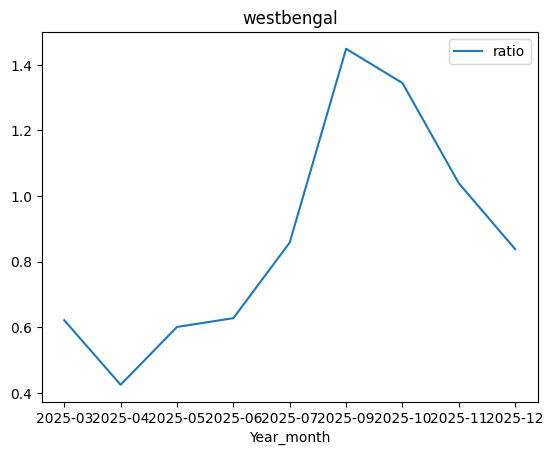

In [31]:
# state-month totals
s = demodf.groupby(['State','Year_month'])[demoage].sum().sum(axis=1).reset_index(name='val')

# total-month totals
t = demodf.groupby('Year_month')[demoage].sum().sum(axis=1).reset_index(name='total')

# normalize by mean
s['norm'] = s['val'] / s.groupby('State')['val'].transform('mean')
t['norm_total'] = t['total'] / t['total'].mean()

# merge + ratio
m = s.merge(t[['Year_month','norm_total']], on='Year_month')
m['ratio'] = m['norm'] / m['norm_total']

# plot
for state, d in m.groupby('State'):
    d.plot(x='Year_month', y='ratio', title=state)
    plt.show()


Standardization & Z-score Analysis - Demographic Data

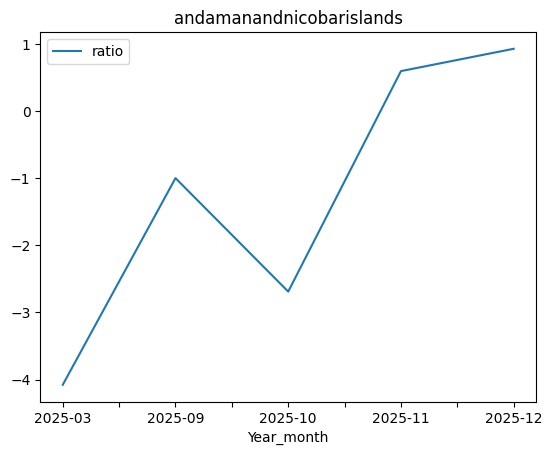

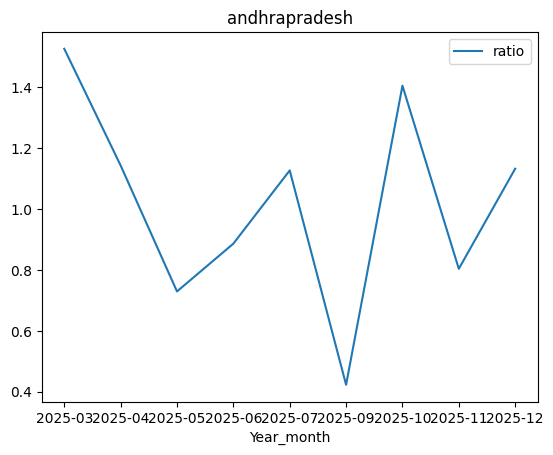

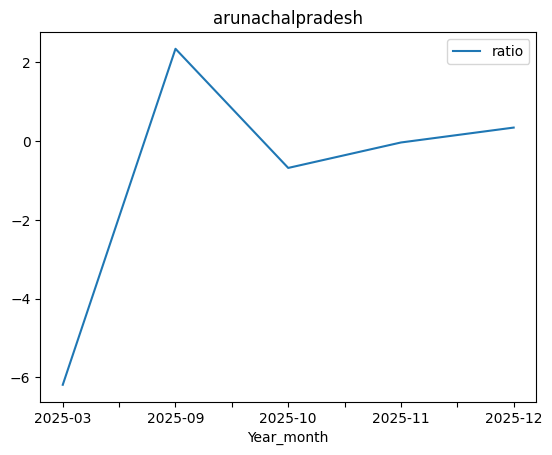

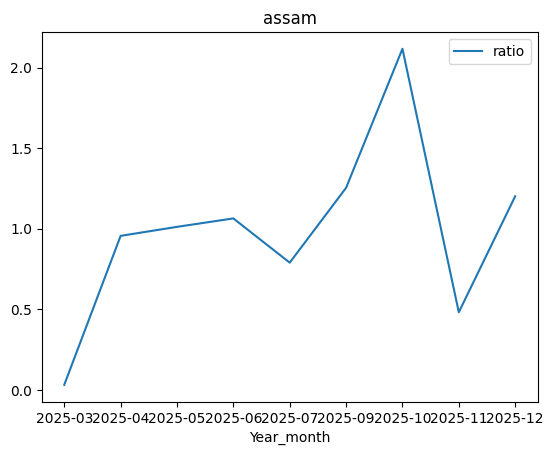

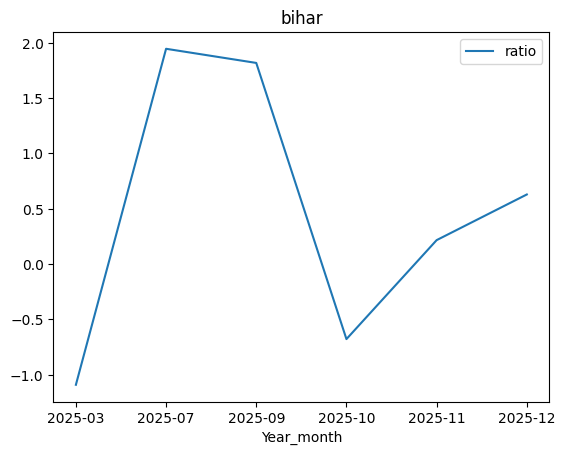

...

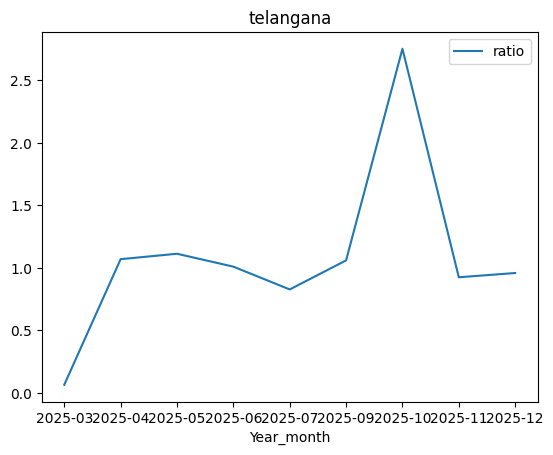

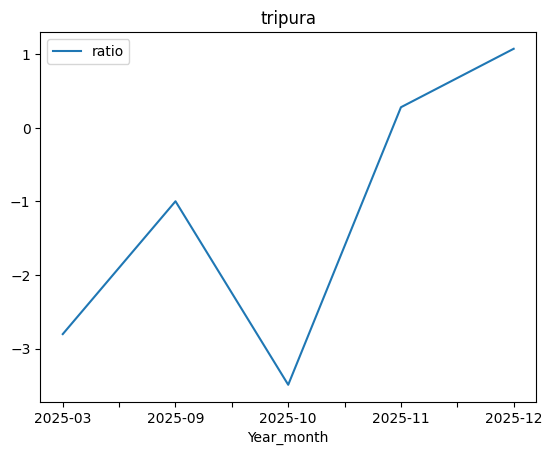

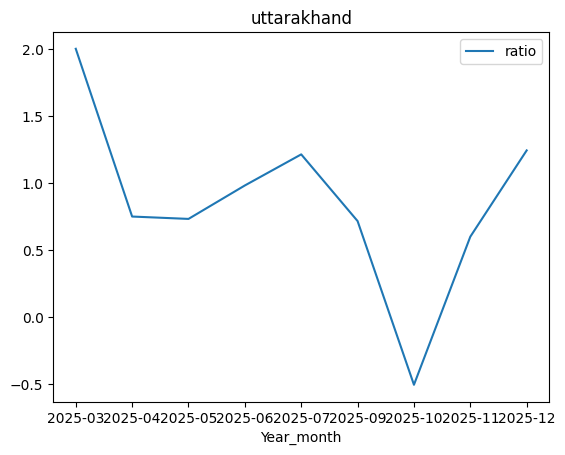

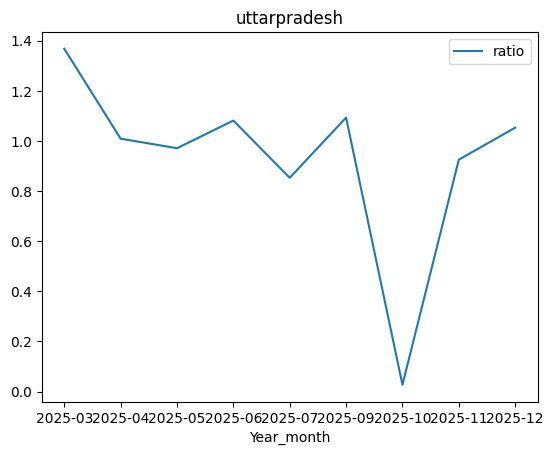

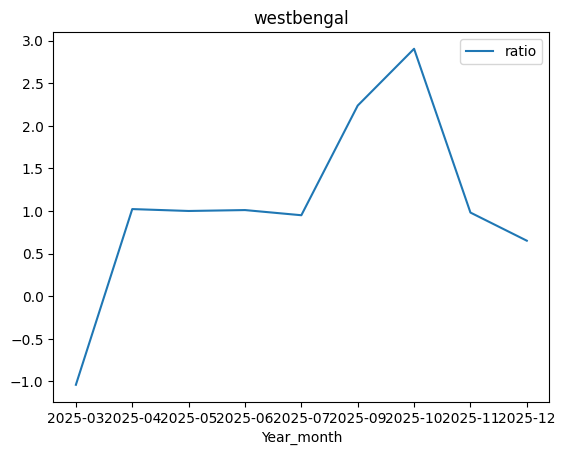

In [32]:
from sklearn.preprocessing import StandardScaler

# state-month totals
s = demodf.groupby(['State','Year_month'])[demoage].sum().sum(axis=1).reset_index(name='val')

# total-month totals
t = demodf.groupby('Year_month')[demoage].sum().sum(axis=1).reset_index(name='total')

sc = StandardScaler()

# scale per state
s['z_state'] = s.groupby('State')['val'].transform(lambda x: sc.fit_transform(x.values.reshape(-1,1)).ravel())

# scale total
t['z_total'] = sc.fit_transform(t[['total']]).ravel()

# merge + ratio
m = s.merge(t[['Year_month','z_total']], on='Year_month')
m['ratio'] = m['z_state'] / m['z_total']

# plot
for state, d in m.groupby('State'):
    d.plot(x='Year_month', y='ratio', title=state)
    plt.show()


In [33]:
demodf[demodf['Year_month']=='2025-10'][demoage].sum().sum()

np.int64(5549562)

Standardization & Z-score Analysis - Enrollment Data

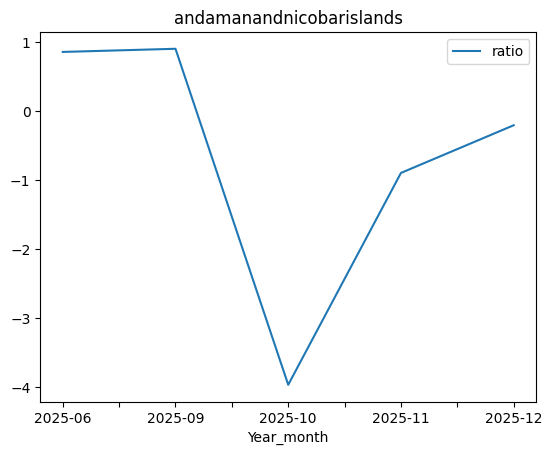

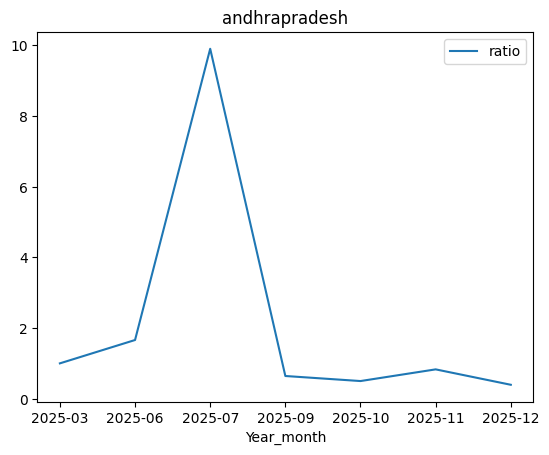

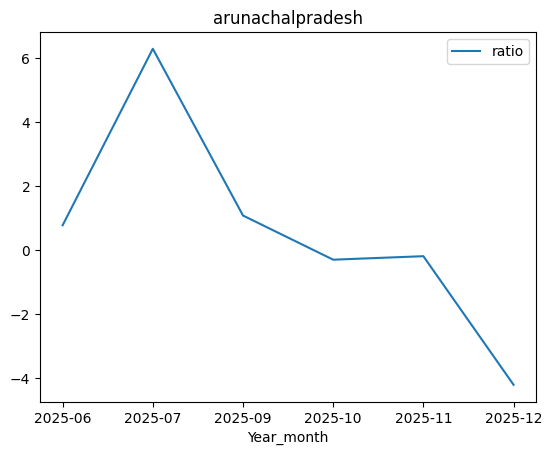

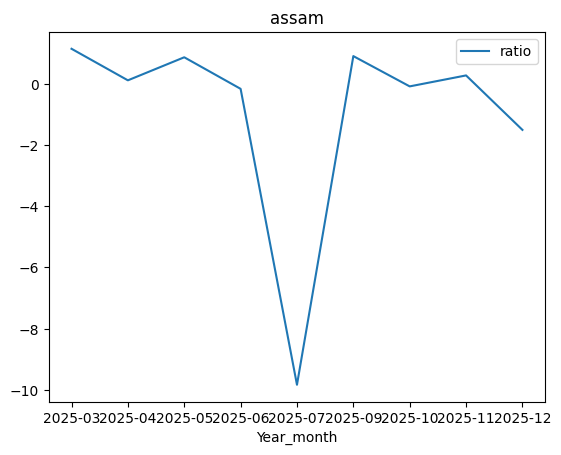

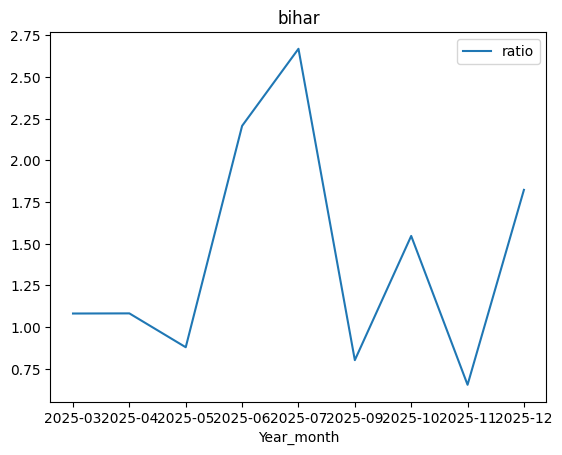

...

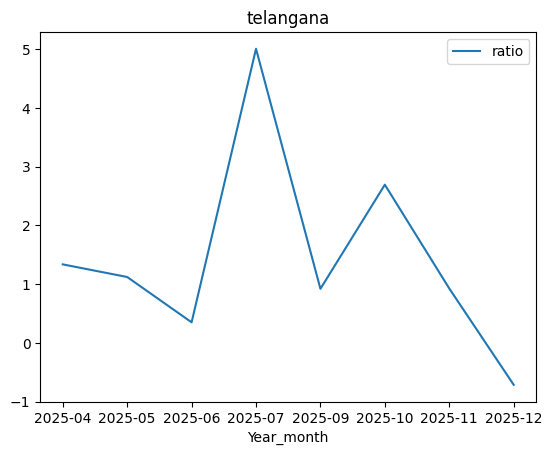

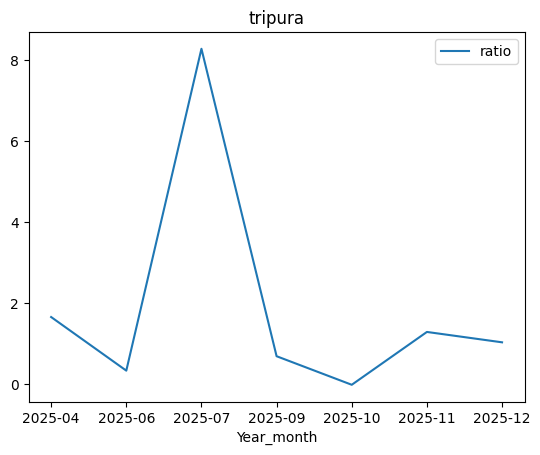

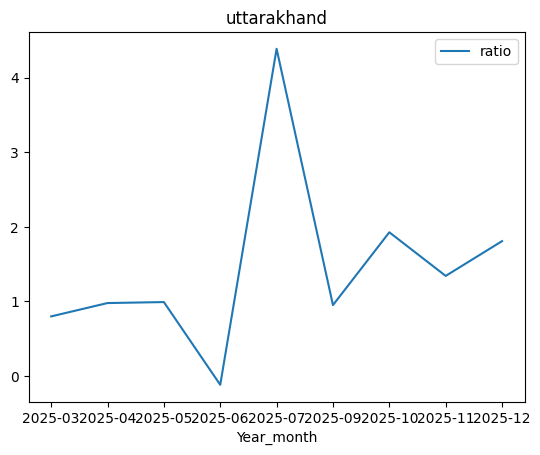

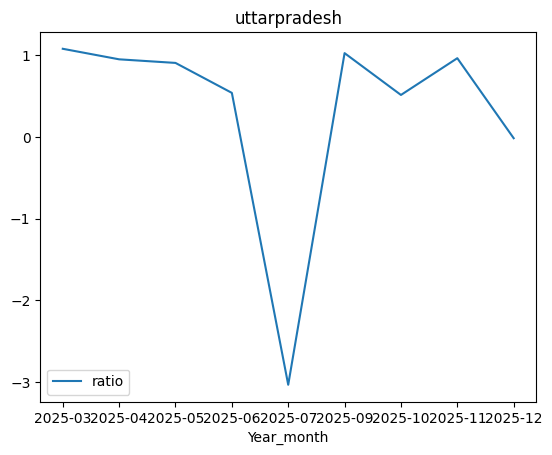

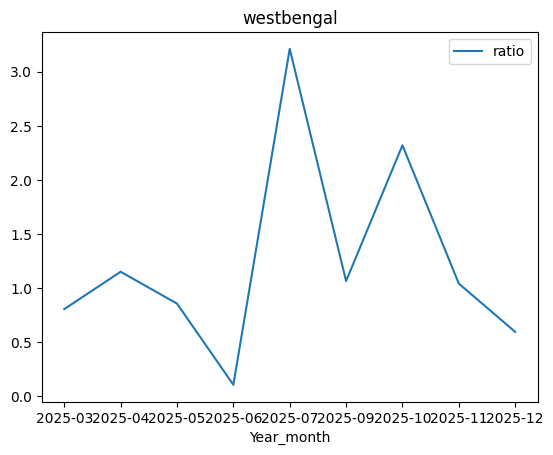

In [34]:
s = enroldf.groupby(['State','Year_month'])[enrolage].sum().sum(axis=1).reset_index(name='val')
t = enroldf.groupby('Year_month')[enrolage].sum().sum(axis=1).reset_index(name='total')

sc = StandardScaler()
s['z_state'] = s.groupby('State')['val'].transform(lambda x: sc.fit_transform(x.values.reshape(-1,1)).ravel())
t['z_total'] = sc.fit_transform(t[['total']]).ravel()
m = s.merge(t[['Year_month','z_total']], on='Year_month')
m['ratio'] = m['z_state'] / m['z_total']

for state, d in m.groupby('State'):
    d.plot(x='Year_month', y='ratio', title=state)
    plt.show()


Standardization & Z-score Analysis - Biometric Data

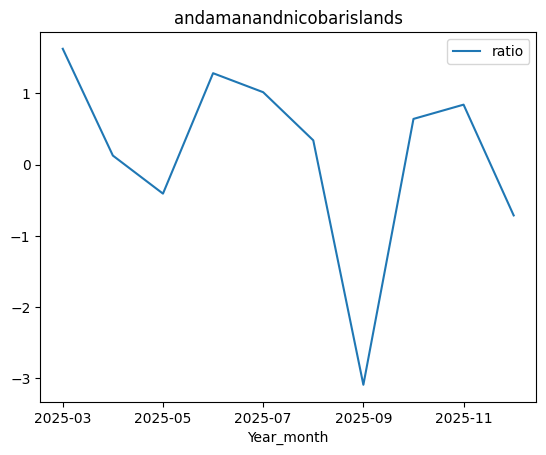

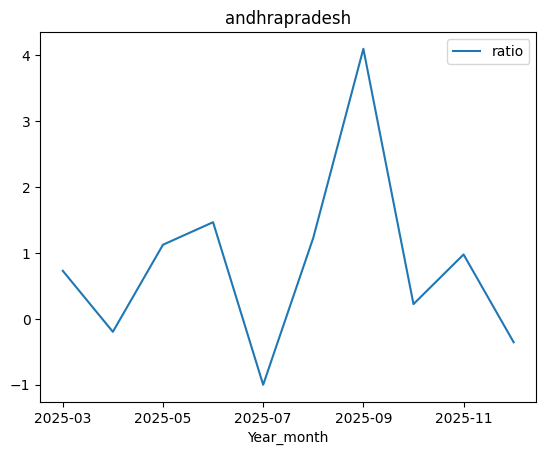

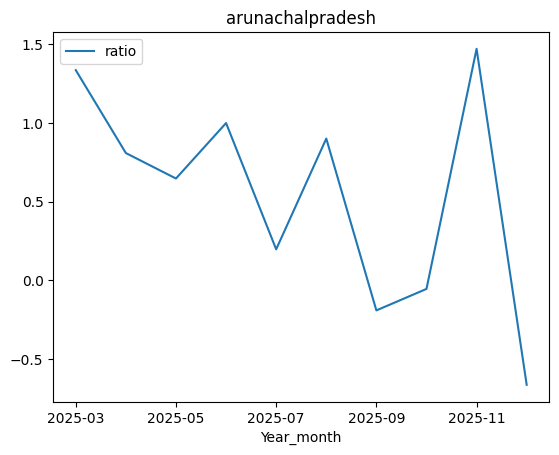

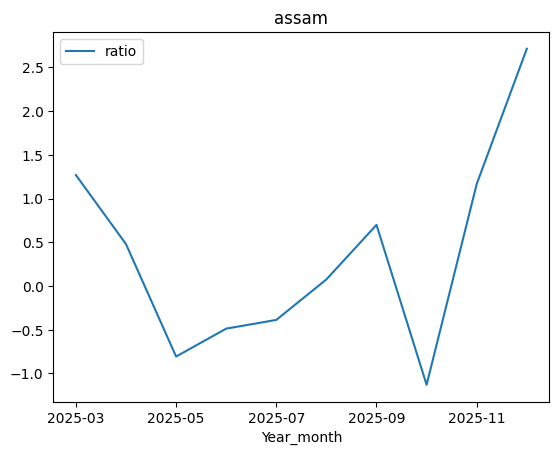

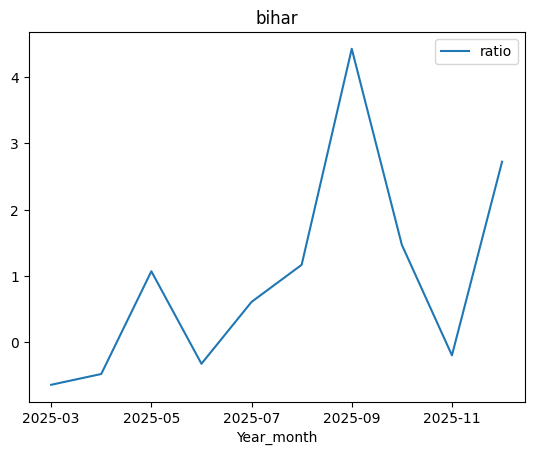

...

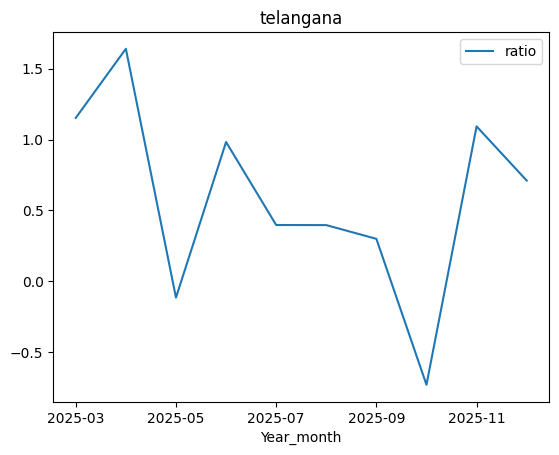

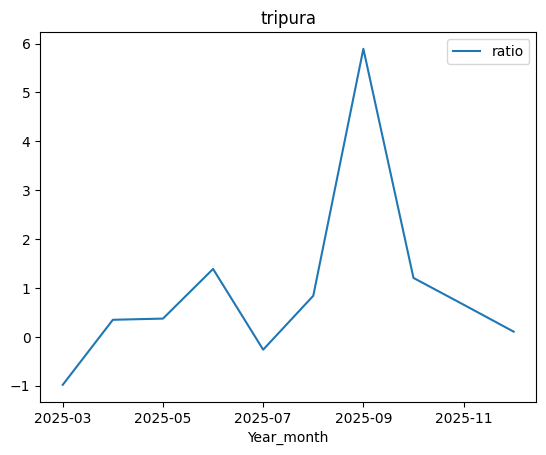

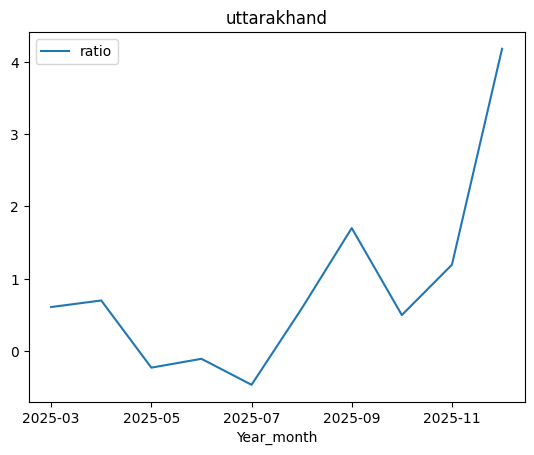

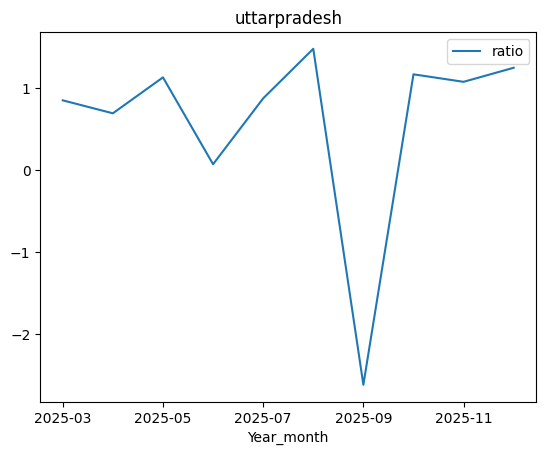

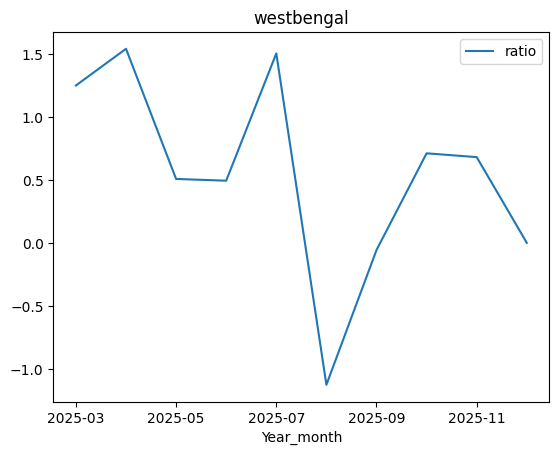

In [35]:
s = biodf.groupby(['State','Year_month'])[bioage].sum().sum(axis=1).reset_index(name='val')
t = biodf.groupby('Year_month')[bioage].sum().sum(axis=1).reset_index(name='total')

sc = StandardScaler()
s['z_state'] = s.groupby('State')['val'].transform(lambda x: sc.fit_transform(x.values.reshape(-1,1)).ravel())
t['z_total'] = sc.fit_transform(t[['total']]).ravel()
m = s.merge(t[['Year_month','z_total']], on='Year_month')
m['ratio'] = m['z_state'] / m['z_total']

for state, d in m.groupby('State'):
    d.plot(x='Year_month', y='ratio', title=state)
    plt.show()

# Histogram Analysis of Daily Records

Enrollment data

In [36]:
import numpy as np

<Axes: ylabel='Frequency'>

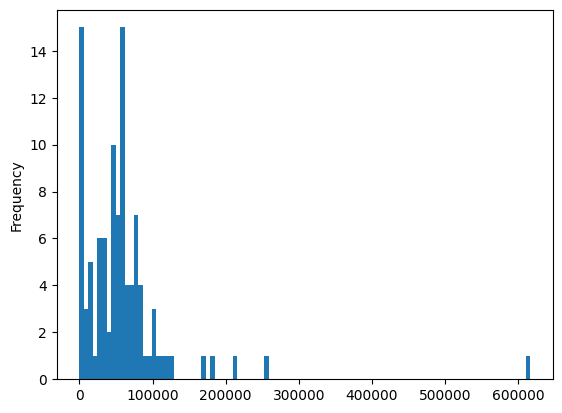

In [37]:
s = enroldf.groupby('Date')[enrolage].sum().sum(axis=1)
s.plot(kind='hist', bins=100)

In [38]:
dates = enroldf.groupby('Year_month')['Date'].nunique()
dates

,Date
Year_month,
2025-03,9
2025-04,1
2025-05,1
2025-06,12
2025-07,1
2025-09,30
2025-10,18
2025-11,20
2025-12,11


In [39]:
s.value_counts().head(10)

,count
109,1
3404,1
3102,1
6218,1
576,1
211,1
2704,1
191,1
67,1
257438,1


In [40]:
len(s)

103

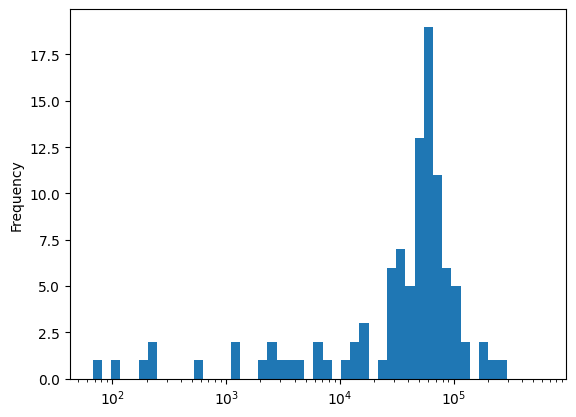

In [41]:
bins = np.logspace(np.log10(s.min()), np.log10(s.max()), 50)
s[s > 0].plot(kind='hist', bins=bins)
plt.xscale('log')

/tmp/ipython-input-742605111.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


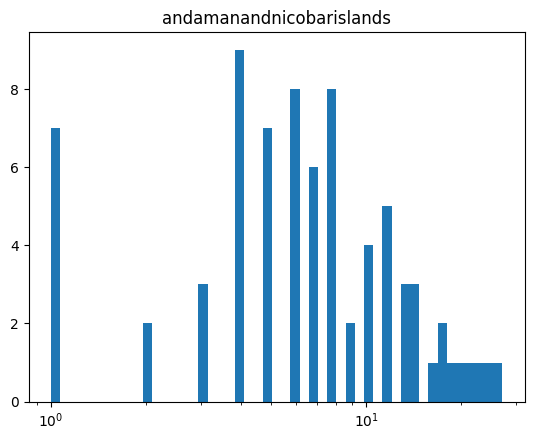

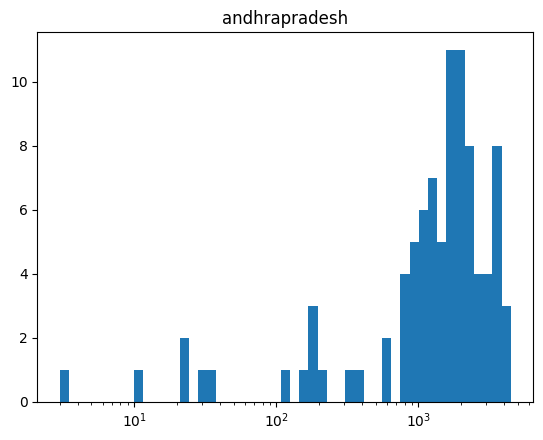

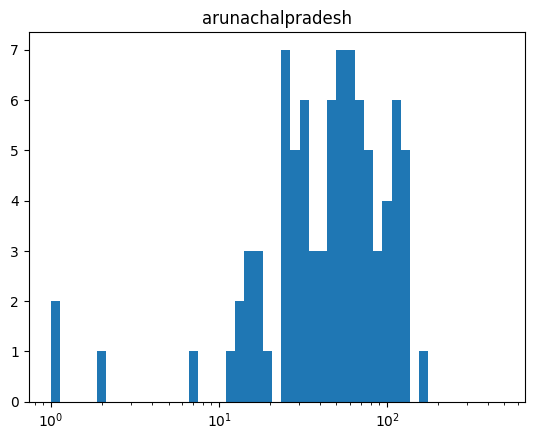

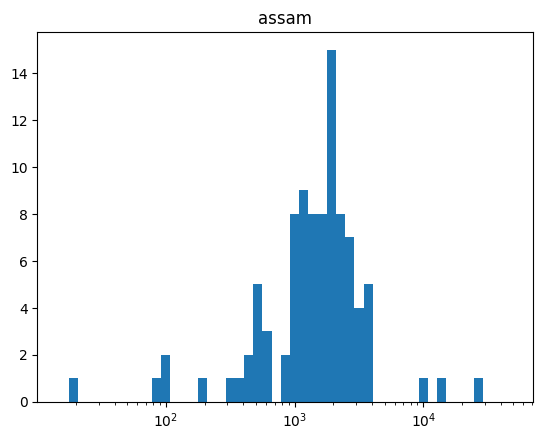

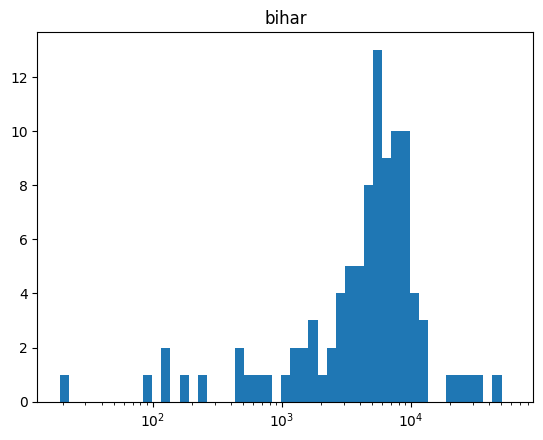

...

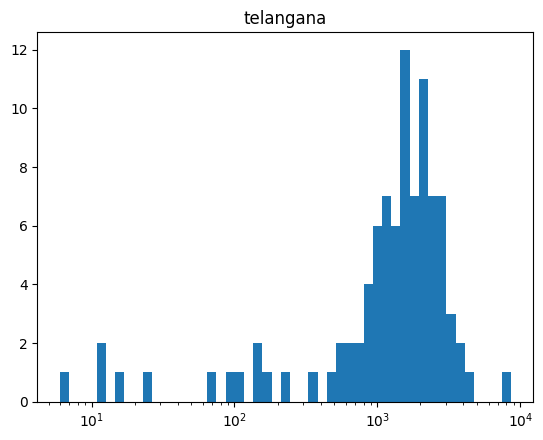

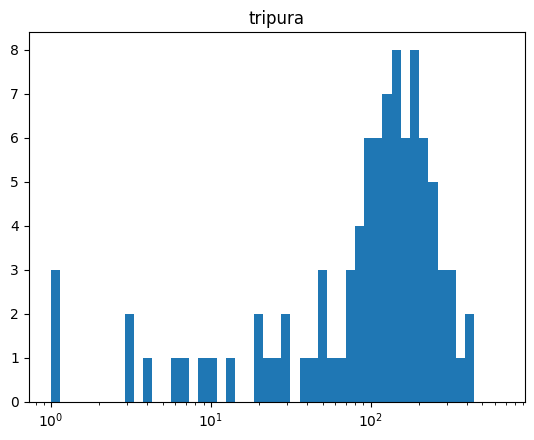

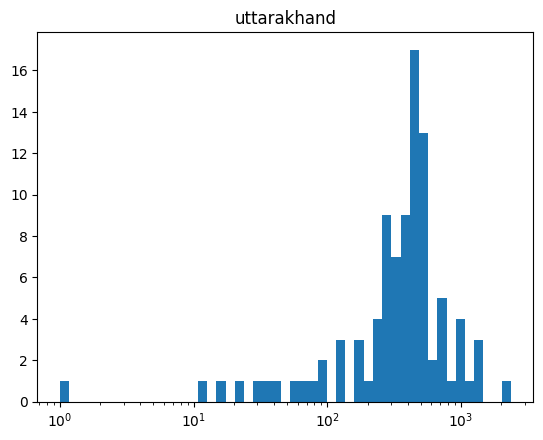

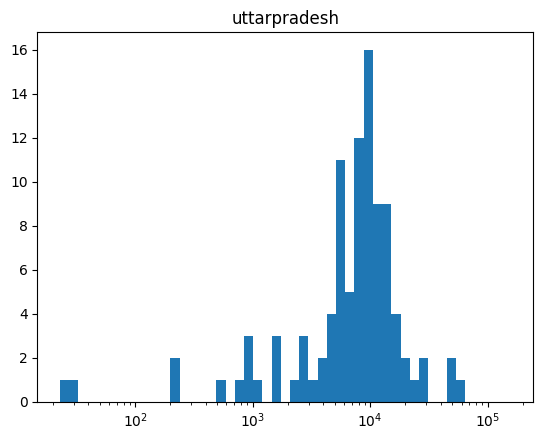

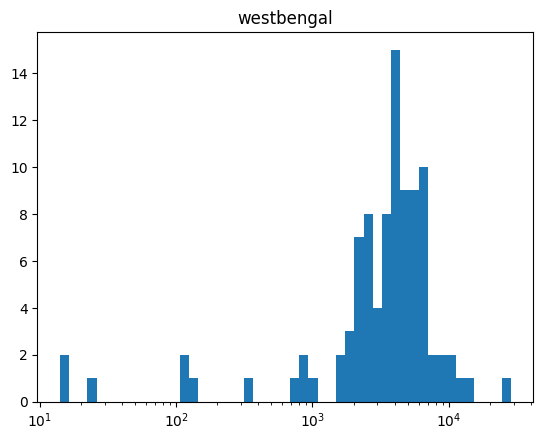

In [42]:
for state, df in enroldf.groupby('State'):
  s = df.groupby('Date')[enrolage].sum().sum(axis=1)
  bins = np.logspace(np.log10(s.min()), np.log10(s.max()), 50)
  s = s[s > 0]
  plt.figure()
  plt.hist(s, bins=bins)
  plt.xscale('log')
  plt.title(state)

In [43]:
table = enroldf.pivot_table(
    index='State',
    columns='Year_month',
    values='Date',
    aggfunc='nunique'
)

table

Year_month,2025-03,2025-04,2025-05,2025-06,2025-07,2025-09,2025-10,2025-11,2025-12
State,,,,,,,,,
andamanandnicobarislands,NaN,NaN,NaN,9.0,NaN,23.0,15.0,18.0,11.0
andhrapradesh,1.0,NaN,NaN,12.0,1.0,30.0,18.0,20.0,11.0
arunachalpradesh,NaN,NaN,NaN,11.0,1.0,29.0,18.0,19.0,11.0
assam,2.0,1.0,1.0,12.0,1.0,30.0,18.0,20.0,11.0
bihar,5.0,1.0,1.0,12.0,1.0,30.0,18.0,20.0,11.0
chandigarh,NaN,1.0,NaN,11.0,NaN,29.0,16.0,19.0,11.0
chhattisgarh,1.0,1.0,1.0,12.0,1.0,30.0,18.0,20.0,11.0
dadranagarhavelidamandiu,NaN,NaN,NaN,12.0,1.0,27.0,16.0,19.0,11.0
delhi,2.0,1.0,1.0,12.0,1.0,30.0,18.0,20.0,11.0


Biometric data

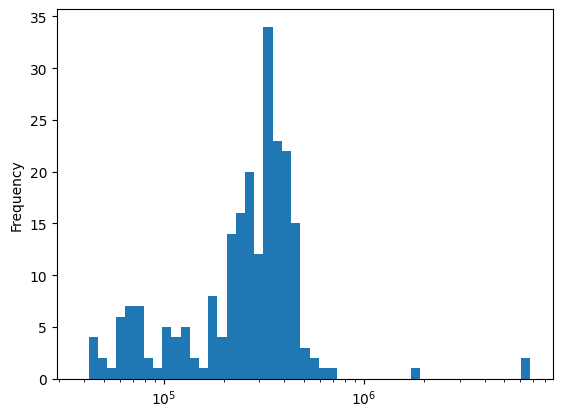

In [44]:
s = biodf.groupby('Date')[bioage].sum().sum(axis=1)
bins = np.logspace(np.log10(s.min()), np.log10(s.max()), 50)
s.plot(kind='hist', bins=bins)
plt.xscale('log')

/tmp/ipython-input-2727527858.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


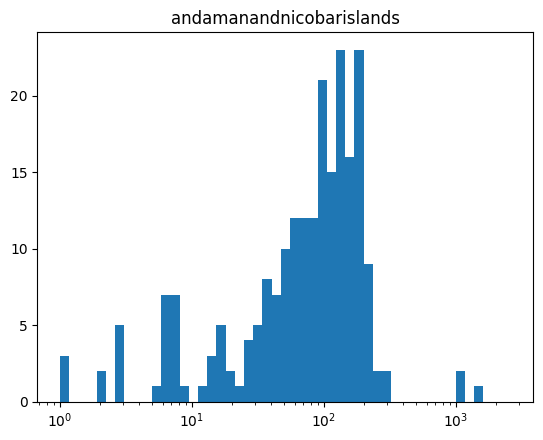

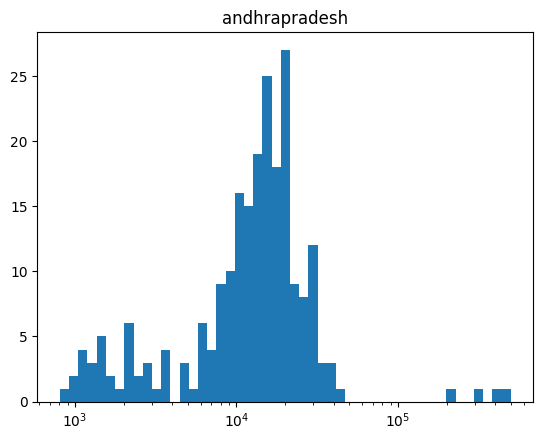

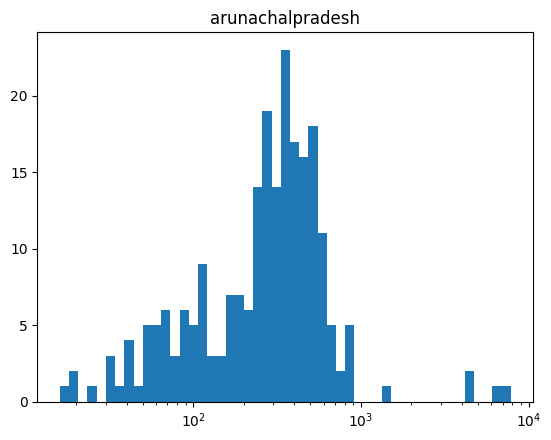

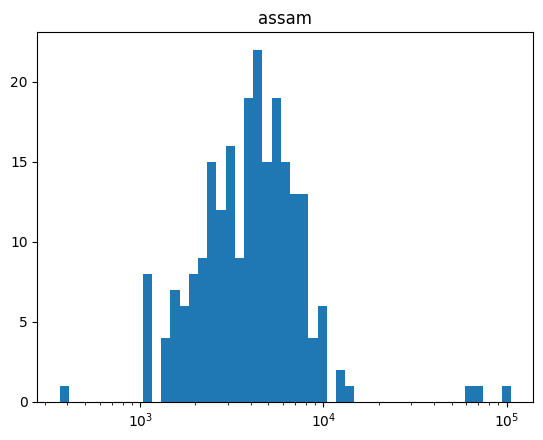

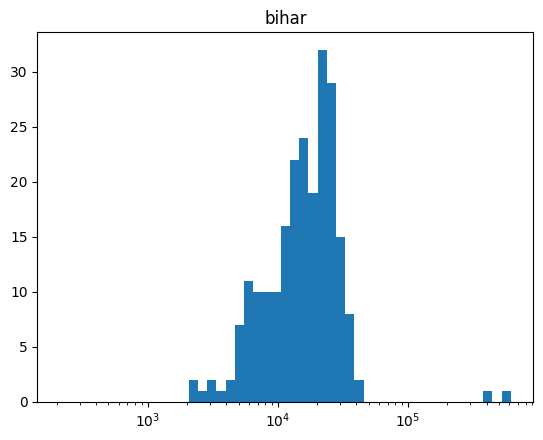

...

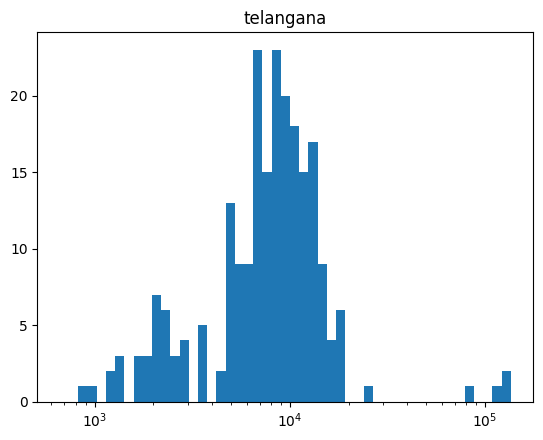

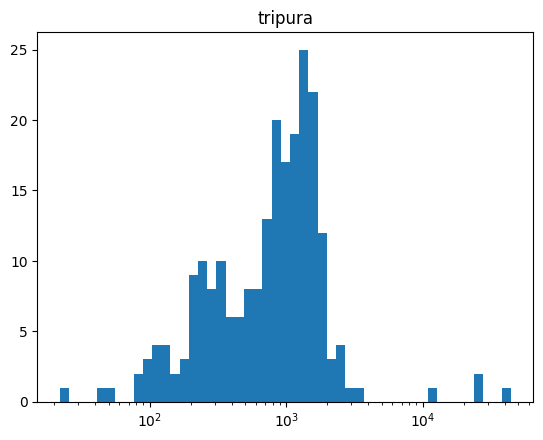

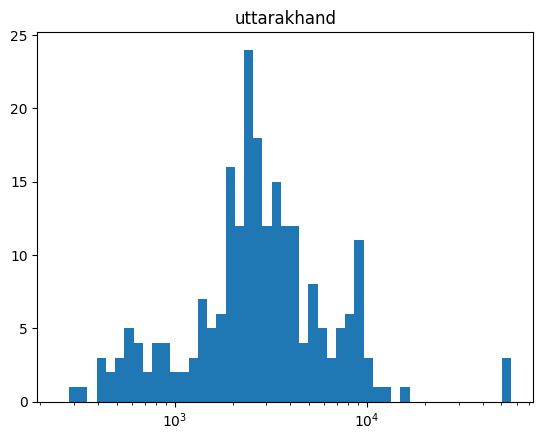

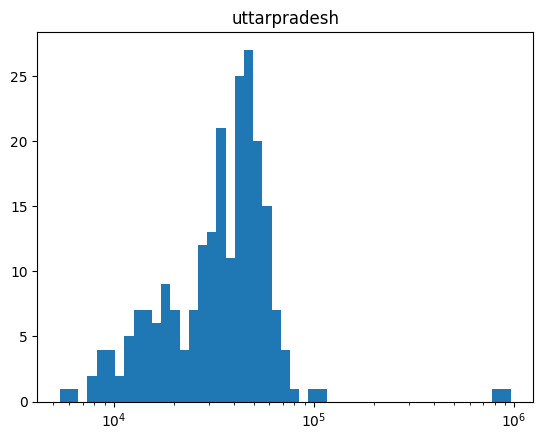

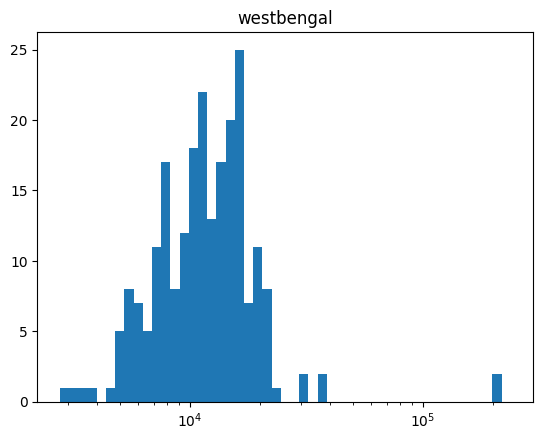

In [45]:
for state, df in biodf.groupby('State'):
  s = df.groupby('Date')[bioage].sum().sum(axis=1)
  bins = np.logspace(np.log10(s.min()), np.log10(s.max()), 50)
  s = s[s > 0]
  plt.figure()
  plt.hist(s, bins=bins)
  plt.xscale('log')
  plt.title(state)

In [46]:
dates = biodf.groupby('Year_month')['Date'].nunique()
dates

,Date
Year_month,
2025-03,1
2025-04,1
2025-05,13
2025-06,30
2025-07,31
2025-08,31
2025-09,30
2025-10,31
2025-11,30


In [47]:
table = biodf.pivot_table(
    index='State',
    columns='Year_month',
    values='Date',
    aggfunc='nunique'
)

table

Year_month,2025-03,2025-04,2025-05,2025-06,2025-07,2025-08,2025-09,2025-10,2025-11,2025-12
State,,,,,,,,,,
andamanandnicobarislands,1,1,13,30,30,29,30,30,30,29
andhrapradesh,1,1,13,30,31,31,30,31,30,29
arunachalpradesh,1,1,13,30,31,31,30,31,30,29
assam,1,1,13,30,31,31,30,31,30,29
bihar,1,1,13,30,31,31,30,31,30,29
chandigarh,1,1,13,30,31,31,30,31,30,29
chhattisgarh,1,1,13,30,31,31,30,31,30,29
dadranagarhavelidamandiu,1,1,13,30,31,31,30,31,30,29
delhi,1,1,13,30,31,31,30,31,30,29


Demographic data

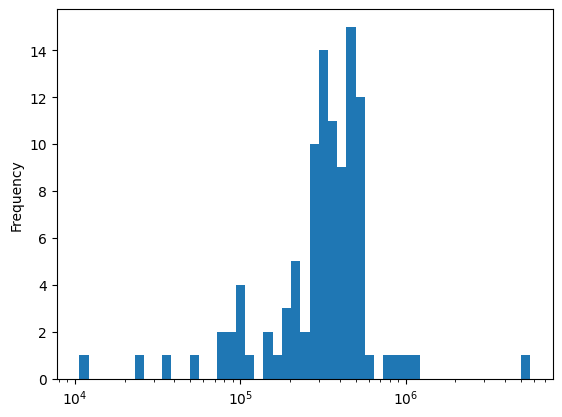

In [48]:
s = demodf.groupby('Date')[demoage].sum().sum(axis=1)
bins = np.logspace(np.log10(s.min()), np.log10(s.max()), 50)
s.plot(kind='hist', bins=bins)
plt.xscale('log')

/tmp/ipython-input-456159440.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


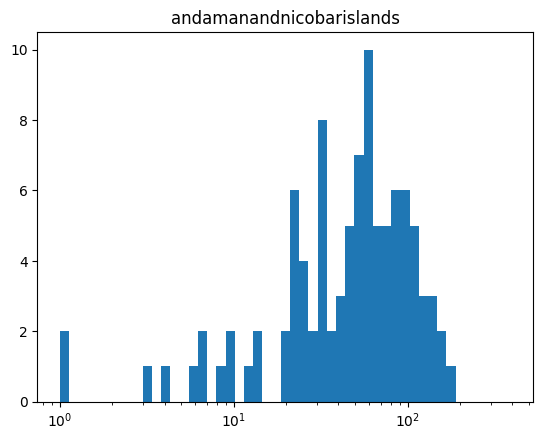

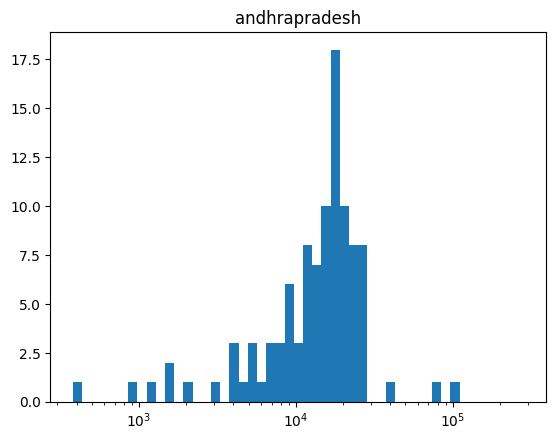

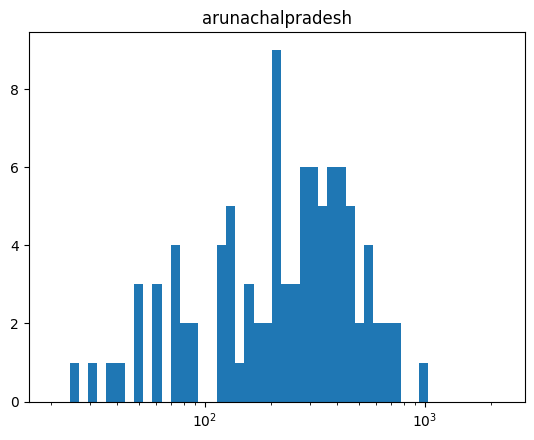

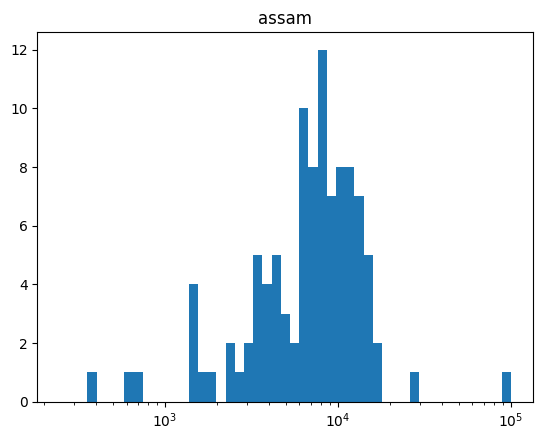

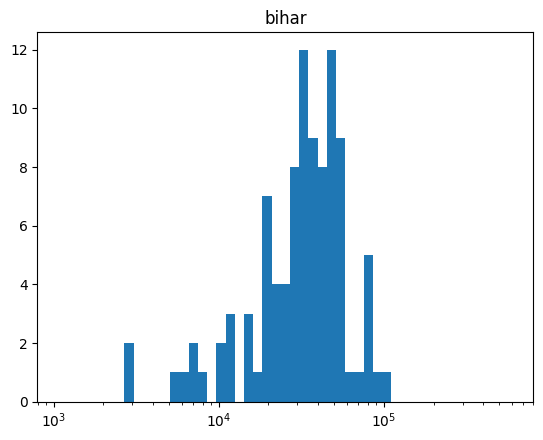

...

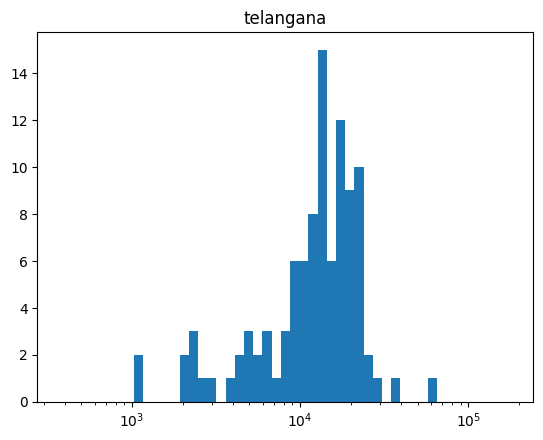

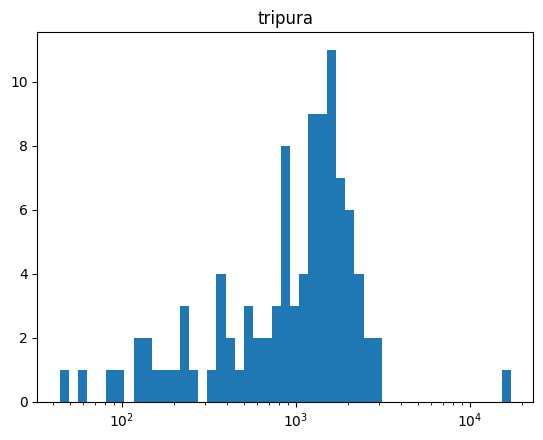

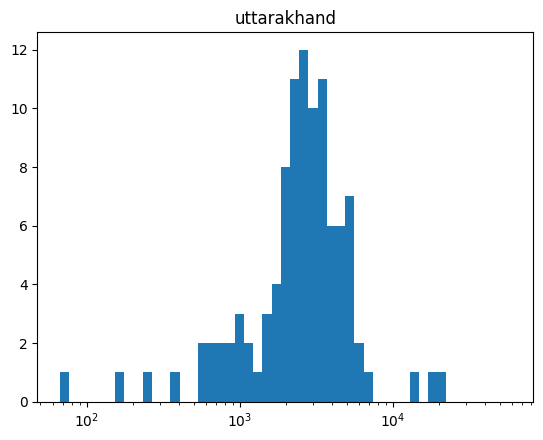

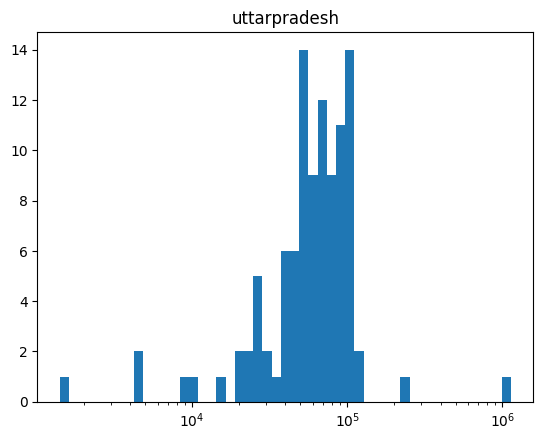

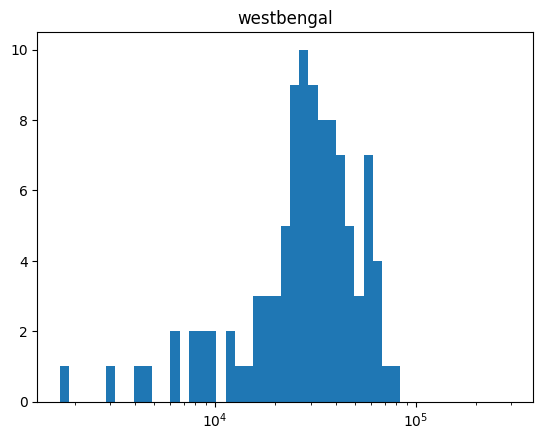

In [49]:
for state, df in demodf.groupby('State'):
  s = df.groupby('Date')[demoage].sum().sum(axis=1)
  bins = np.logspace(np.log10(s.min()), np.log10(s.max()), 50)
  s = s[s > 0]
  plt.figure()
  plt.hist(s, bins=bins)
  plt.xscale('log')
  plt.title(state)

In [50]:
dates = demodf.groupby('Year_month')['Date'].nunique()
dates

,Date
Year_month,
2025-03,1
2025-04,1
2025-05,1
2025-06,1
2025-07,1
2025-09,20
2025-10,18
2025-11,30
2025-12,30


In [51]:
table = demodf.pivot_table(
    index='State',
    columns='Year_month',
    values='Date',
    aggfunc='nunique'
)

table

Year_month,2025-03,2025-04,2025-05,2025-06,2025-07,2025-09,2025-10,2025-11,2025-12
State,,,,,,,,,
andamanandnicobarislands,1.0,NaN,NaN,NaN,NaN,20.0,18.0,30.0,30.0
andhrapradesh,1.0,1.0,1.0,1.0,1.0,20.0,18.0,30.0,30.0
arunachalpradesh,1.0,NaN,NaN,NaN,NaN,20.0,18.0,30.0,30.0
assam,1.0,1.0,1.0,1.0,1.0,20.0,18.0,30.0,30.0
bihar,1.0,NaN,NaN,NaN,1.0,20.0,18.0,30.0,30.0
chandigarh,1.0,1.0,1.0,1.0,1.0,20.0,18.0,30.0,30.0
chhattisgarh,1.0,1.0,1.0,1.0,1.0,20.0,18.0,30.0,30.0
dadranagarhavelidamandiu,1.0,1.0,NaN,NaN,NaN,20.0,18.0,30.0,30.0
delhi,1.0,1.0,1.0,1.0,1.0,20.0,18.0,30.0,30.0


# Pincode Validity and Coverage Analysis

Load Pincode data from Govt's official Pincodes dataset, saved into huggingface dataset

In [52]:
len(demodf['Pincode'].unique())

19766

In [53]:
from datasets import Features, Value

features = Features({
    "pincode": Value("int64"),
    "statename": Value("string")
})



In [54]:
ds = load_dataset("an42/uidai1", data_files="pincodes1.csv", features=features)
# ds = ds.remove_columns(["latitude", "longitude"])
pindf = ds["train"].to_pandas()

pincodes1.csv:   0%|          | 0.00/23.1M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [55]:
pindf['pincode'] = pindf['pincode'].astype(int)
pindf.columns

Index(['pincode', 'statename'], dtype='object')

Comparision - Pincode data vs Demographic updates pincodes

In [56]:
# p = set(map(int,pindf['pincode'].unique()))
# pd = set(map(int, demodf['Pincode'].unique()))
p = set(pindf['pincode'].unique())
pd = set(demodf['Pincode'].unique())
print(len(p - pd))
print(len(pd - p))

775
955


In [57]:
p-pd

{np.int64(110069),
 np.int64(110097),
 np.int64(110099),
 np.int64(110102),
 np.int64(110106),
 np.int64(110110),
 np.int64(110119),
 np.int64(110124),
 np.int64(110151),
 np.int64(110195),
 np.int64(121015),
 np.int64(121999),
 np.int64(122012),
 np.int64(122998),
 np.int64(122999),
 np.int64(123031),
 np.int64(124010),
 np.int64(124141),
 np.int64(124508),
 np.int64(124515),
 np.int64(125007),
 np.int64(125011),
 np.int64(125056),
 np.int64(125061),
 np.int64(131030),
 np.int64(132035),
 np.int64(133008),
 np.int64(133010),
 np.int64(133207),
 np.int64(134005),
 np.int64(134008),
 np.int64(134999),
 np.int64(135004),
 np.int64(136134),
 np.int64(140127),
 np.int64(140128),
 np.int64(140402),
 np.int64(140408),
 np.int64(141011),
 np.int64(141127),
 np.int64(142002),
 np.int64(142003),
 np.int64(143004),
 np.int64(143402),
 np.int64(144415),
 np.int64(144603),
 np.int64(145002),
 np.int64(147007),
 np.int64(147008),
 np.int64(148002),
 np.int64(148017),
 np.int64(151006),
 np.int64(15

In [58]:
pd-p

{np.int64(121705),
 np.int64(123003),
 np.int64(127110),
 np.int64(133021),
 np.int64(133105),
 np.int64(134002),
 np.int64(134011),
 np.int64(134115),
 np.int64(141017),
 np.int64(141124),
 np.int64(142028),
 np.int64(142051),
 np.int64(143003),
 np.int64(143007),
 np.int64(143026),
 np.int64(143104),
 np.int64(143110),
 np.int64(144004),
 np.int64(144011),
 np.int64(144012),
 np.int64(144013),
 np.int64(144014),
 np.int64(144203),
 np.int64(144304),
 np.int64(145021),
 np.int64(147506),
 np.int64(151107),
 np.int64(171302),
 np.int64(171303),
 np.int64(171304),
 np.int64(173020),
 np.int64(173028),
 np.int64(173216),
 np.int64(173219),
 np.int64(174401),
 np.int64(174402),
 np.int64(174403),
 np.int64(175122),
 np.int64(175137),
 np.int64(176120),
 np.int64(176121),
 np.int64(176122),
 np.int64(176123),
 np.int64(176126),
 np.int64(176213),
 np.int64(176219),
 np.int64(177030),
 np.int64(182117),
 np.int64(185111),
 np.int64(191123),
 np.int64(192102),
 np.int64(192306),
 np.int64(19

In [59]:
p_only = pindf[~pindf['pincode'].isin(demodf['Pincode'])]
d_only = demodf[~demodf['Pincode'].isin(pindf['pincode'])]


In [60]:
p_state_counts = p_only.groupby('statename')['pincode'].nunique()
d_state_counts = d_only.groupby('State')['Pincode'].nunique()


In [61]:
from IPython.display import display

display(p_state_counts.reset_index(name='unique_pincodes'))
display(d_state_counts.reset_index(name='unique_pincodes'))

,statename,unique_pincodes
0,ANDHRA PRADESH,46
1,ARUNACHAL PRADESH,3
2,ASSAM,12
3,BIHAR,41
4,CHANDIGARH,2
5,CHHATTISGARH,21
6,DELHI,10
7,GOA,2
8,GUJARAT,47
9,HARYANA,19


,State,unique_pincodes
0,andhrapradesh,22
1,arunachalpradesh,6
2,assam,10
3,bihar,81
4,chhattisgarh,10
5,goa,2
6,gujarat,70
7,haryana,7
8,himachalpradesh,20
9,jammuandkashmir,10


Comparision - Pincode data vs Enrollments pincodes

In [62]:
p = set(pindf['pincode'].unique())
pe = set(enroldf['Pincode'].unique())
print(len(p - pe))
print(len(pe - p))

919
829


In [63]:
p_only = pindf[~pindf['pincode'].isin(enroldf['Pincode'])]
e_only = enroldf[~enroldf['Pincode'].isin(pindf['pincode'])]

In [64]:
p_state_counts = p_only.groupby('statename')['pincode'].nunique()
e_state_counts = e_only.groupby('State')['Pincode'].nunique()

In [65]:
display(p_state_counts.reset_index(name='unique_pincodes'))
display(e_state_counts.reset_index(name='unique_pincodes'))

,statename,unique_pincodes
0,ANDHRA PRADESH,54
1,ARUNACHAL PRADESH,5
2,ASSAM,15
3,BIHAR,48
4,CHANDIGARH,2
5,CHHATTISGARH,23
6,DELHI,10
7,GOA,4
8,GUJARAT,59
9,HARYANA,21


,State,unique_pincodes
0,andhrapradesh,16
1,arunachalpradesh,6
2,assam,8
3,bihar,74
4,chhattisgarh,8
5,gujarat,70
6,haryana,5
7,himachalpradesh,19
8,jammuandkashmir,8
9,jharkhand,9


Comparision - Pincode data vs Biometric updates pincodes

In [66]:
p = set(pindf['pincode'].unique())
pb = set(biodf['Pincode'].unique())
print(len(p - pb))
print(len(pb - p))

746
1028


In [67]:
p_only = pindf[~pindf['pincode'].isin(biodf['Pincode'])]
b_only = biodf[~biodf['Pincode'].isin(pindf['pincode'])]

In [68]:
p_state_counts = p_only.groupby('statename')['pincode'].nunique()
b_state_counts = b_only.groupby('State')['Pincode'].nunique()

In [69]:
display(p_state_counts.reset_index(name='unique_pincodes'))
display(b_state_counts.reset_index(name='unique_pincodes'))

,statename,unique_pincodes
0,ANDHRA PRADESH,45
1,ARUNACHAL PRADESH,3
2,ASSAM,12
3,BIHAR,41
4,CHANDIGARH,2
5,CHHATTISGARH,20
6,DELHI,9
7,GOA,1
8,GUJARAT,45
9,HARYANA,17


,State,unique_pincodes
0,andhrapradesh,25
1,arunachalpradesh,6
2,assam,11
3,bihar,82
4,chhattisgarh,13
5,goa,2
6,gujarat,71
7,haryana,10
8,himachalpradesh,20
9,jammuandkashmir,11
